In [1]:
import tensorflow as tf
from tensorflow.keras.utils import load_img
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, Dropout, Flatten, MaxPooling2D, Input
import numpy as np
import random
import matplotlib.pyplot as plt
import os 
#import seaborn as sns
import warnings 
from tqdm.notebook import tqdm 
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from PIL import Image
import pandas as pd
import ast
import sys
import shutil
%matplotlib inline

In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import load_img
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, Dropout, Flatten, MaxPooling2D, Input
import numpy as np
import random
import matplotlib.pyplot as plt
import os 
#import seaborn as sns
import warnings 
from tqdm.notebook import tqdm 
%matplotlib inline


In [ ]:
from tensorflow.python.client import device_lib 
print(device_lib.list_local_devices())


[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 9205196529567646104
xla_global_id: -1
]


In [ ]:
print(tf.config.list_physical_devices())

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
gpus = tf.config.list_physical_devices('GPU')
print("Num GPUs Available: ", len(gpus))

Num GPUs Available:  1


In [ ]:
BASE_DIR = 'C:\\Users\\kacpe\\OneDrive\\Pulpit\\Uczelnia\\semestr5\\MachineLearning\\UTKFace\\UTKFace'
age_labels = []
image_paths = []

image_filenames = os.listdir(BASE_DIR)
random.shuffle(image_filenames)

image_filenames[0]

'35_0_1_20170113142443251.jpg.chip.jpg'

In [ ]:
for image in image_filenames:
    image_path = os.path.join(BASE_DIR, image)
    img_components = image.split('_')

    if img_components[0] == '.ipynb':
        continue
    age_label = int(img_components[0])
    
    # Append the image_path, age_label, and gender_label
    age_labels.append(age_label)
    image_paths.append(image_path)

In [ ]:
print(f'Number of age_labels: {len(age_labels)}, Number of image_paths: {len(image_paths)}')

Number of age_labels: 23708, Number of image_paths: 23708


In [ ]:
import pandas as pd 
df = pd.DataFrame()
df['image_path'], df['age'] = image_paths, age_labels
df.head(5)

,image_path,age
0,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,35
1,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,53
2,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,2
3,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,35
4,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,26


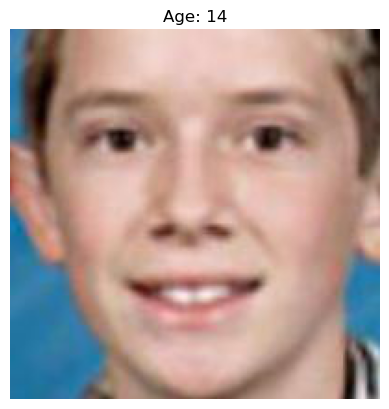

In [ ]:
from PIL import Image

rand_index = random.randint(0, len(image_paths))
age = df['age'][rand_index]
IMG = Image.open(df['image_path'][rand_index])
plt.title(f'Age: {age}')
plt.axis('off')
plt.imshow(IMG)

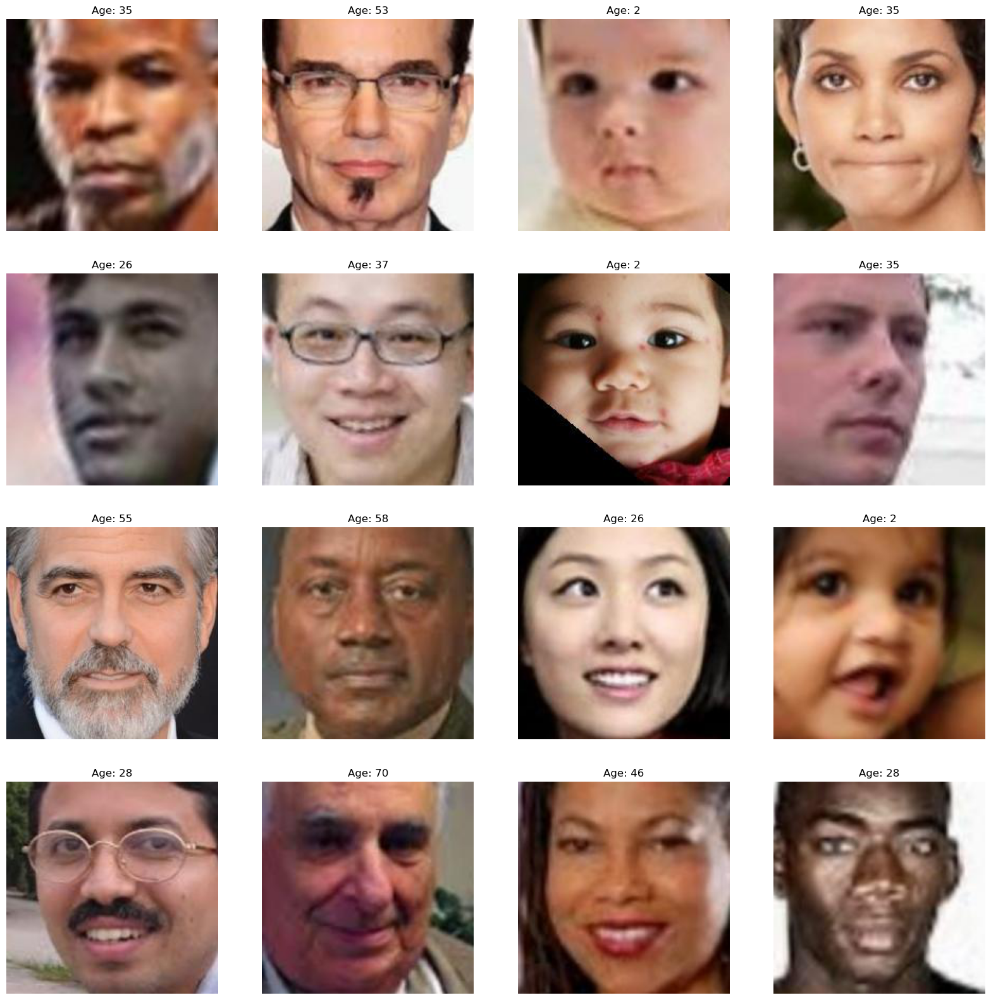

In [ ]:
plt.figure(figsize=(20, 20))
samples = df.iloc[0:16]

for index, sample, age in samples.itertuples():
    plt.subplot(4, 4, index + 1)
    img = load_img(sample)
    img = np.array(img)
    plt.axis('off')
    plt.title(f'Age: {age}')
    plt.imshow(img)

In [ ]:
def extract_image_features(images):
    features = list()

    for image in tqdm(images):
        img = load_img(image)
        img = img.resize((128, 128), Image.LANCZOS)
        img = np.array(img)
        features.append(img)

    features = np.array(features)
    features = features.reshape(len(features), 128, 128, 3)
    return features

In [ ]:
X = extract_image_features(df['image_path'])

  0%|          | 0/23708 [00:00<?, ?it/s]

In [ ]:
X.shape

(23708, 128, 128, 3)

In [ ]:
X = X / 255.0

In [ ]:
y_age = np.array(df['age'])

In [ ]:
import keras

In [ ]:
class ResidualUnit(keras.layers.Layer):
    def __init__(self, filters, strides=1, activation="relu", **kwargs):
        super().__init__(**kwargs)
        self.activation = keras.activations.get(activation)
        self.main_layers = [
            keras.layers.Conv2D(filters, 3, strides=strides, padding="same", use_bias=False),
            keras.layers.BatchNormalization(),
            self.activation,
            keras.layers.Conv2D(filters, 3, strides=1, padding="same", use_bias=False),
            keras.layers.BatchNormalization()]
        self.skip_layers = []
        if strides > 1:
            self.skip_layers = [
                keras.layers.Conv2D(filters, 1, strides=strides, padding="same", use_bias=False),
                keras.layers.BatchNormalization()]

    def call(self, inputs):
        Z = inputs
        for layer in self.main_layers:
            Z = layer(Z)
        skip_Z = inputs
        for layer in self.skip_layers:
            skip_Z = layer(skip_Z)
        return self.activation(Z + skip_Z)

In [ ]:
input_shape = (128, 128, 3)

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.Conv2D(64, 7, strides=2, input_shape=input_shape, padding="same", use_bias=False))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Activation("relu"))
model.add(keras.layers.MaxPool2D(pool_size=3, strides=2, padding="same"))
prev_filters = 64
for filters in [64] * 3 + [128] * 4 + [256] * 6 + [512] * 3:
    strides = 1 if filters == prev_filters else 2
    model.add(ResidualUnit(filters, strides=strides))
    prev_filters=filters
model.add(keras.layers.GlobalAvgPool2D())
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(256, activation="relu"))
model.add(keras.layers.Dense(1, activation="relu"))

In [ ]:
model.compile(loss='mse', optimizer='adam', metrics=['accuracy'])

In [ ]:
history = model.fit(x=X, y=y_age,
                    batch_size=1, epochs=10, validation_split=0.2)

InternalError: Failed copying input tensor from /job:localhost/replica:0/task:0/device:CPU:0 to /job:localhost/replica:0/task:0/device:GPU:0 in order to run _EagerConst: Dst tensor is not initialized.

In [ ]:
from tensorflow.keras.models import load_model
model.save('ResNet_reg.keras')

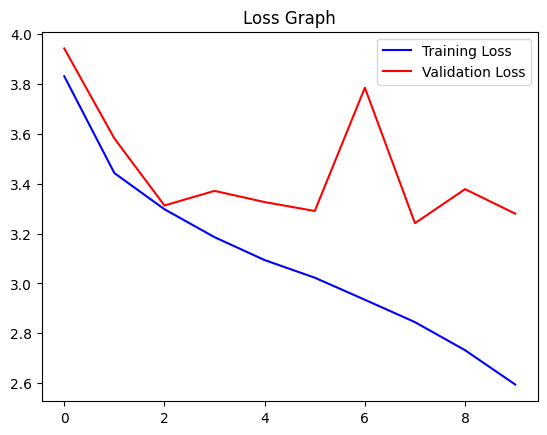

In [ ]:
# plot results for age
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(loss))

plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [ ]:
def get_image_features(image):
  img = load_img(image)
  img = img.resize((128, 128), Image.LANCZOS)
  img = np.array(img)
  img = img.reshape(1, 128, 128, 3)
  img = img / 255.0
  return img

In [ ]:
img_to_test = 'FaceRecognition/CamData/data/test/images/00bf6f4c-7fdd-11ee-9103-ec773ba9cb5a.jpg'
features = get_image_features(img_to_test)
pred = model.predict(features)

pred[0].round(2)

1/1 [==============================] - 1s 507ms/step


array([0.  , 0.11, 0.03, 0.07, 0.05, 0.01, 0.01, 0.01, 0.  , 0.01, 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.01, 0.  , 0.  , 0.01,
       0.  , 0.01, 0.01, 0.01, 0.02, 0.  , 0.  , 0.  , 0.01, 0.  , 0.  ,
       0.  , 0.  , 0.02, 0.  , 0.01, 0.  , 0.02, 0.01, 0.  , 0.  , 0.  ,
       0.  , 0.01, 0.01, 0.  , 0.01, 0.  , 0.01, 0.  , 0.  , 0.02, 0.02,
       0.  , 0.01, 0.  , 0.01, 0.01, 0.02, 0.01, 0.01, 0.01, 0.  , 0.04,
       0.01, 0.01, 0.02, 0.  , 0.03, 0.01, 0.  , 0.01, 0.02, 0.01, 0.01,
       0.01, 0.01, 0.04, 0.03, 0.  , 0.  , 0.01, 0.01, 0.01, 0.03, 0.  ,
       0.  , 0.  , 0.02, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.01, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ], dtype=float32)

In [ ]:
def get_result(model, image):
    features = get_image_features(img_to_test)
    pred = model.predict(features)
    max = pred[0][0]
    result = 0
    i = 0
    for p in pred[0]:
        if p > max:
            max = p
            result = i
        i = i+1
    return result

1/1 [==============================] - 0s 41ms/step


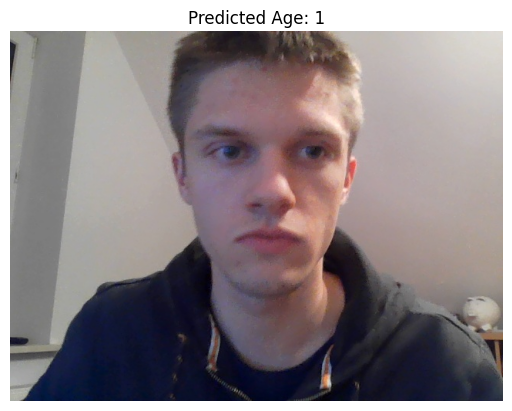

In [ ]:
age = get_result(model, img_to_test)

plt.title(f'Predicted Age: {age}')
plt.axis('off')
plt.imshow(np.array(load_img(img_to_test)))

In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import load_img
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, Dropout, Flatten, MaxPooling2D, Input
import numpy as np
import random
import matplotlib.pyplot as plt
import os 
#import seaborn as sns
import warnings 
from tqdm.notebook import tqdm 
import pandas as pd 
import gc
%matplotlib inline

In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import load_img
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, Dropout, Flatten, MaxPooling2D, Input
import numpy as np
import random
import matplotlib.pyplot as plt
import os 
#import seaborn as sns
import warnings 
from tqdm.notebook import tqdm 
%matplotlib inline

In [ ]:
BASE_DIR = 'C:\\Users\\kacpe\\OneDrive\\Pulpit\\Uczelnia\\semestr5\\MachineLearning\\UTKFace'
age_labels = []
image_paths = []

image_filenames = os.listdir(os.path.join(BASE_DIR, "Train"))
random.shuffle(image_filenames)

image_filenames[0]

'19_augmented_2_19_1_4_20170103233712235.jpg.chip.jpg'

In [ ]:
from move_images_folders import move_images

In [ ]:
move_images(BASE_DIR)

FileNotFoundError: [WinError 3] System nie może odnaleźć określonej ścieżki: 'C:\\Users\\kacpe\\OneDrive\\Pulpit\\Uczelnia\\semestr5\\MachineLearning\\UTKFace\\UTKFace\\UTKFace'

In [ ]:
for image in tqdm(image_filenames):
    image_path = os.path.join(BASE_DIR, image)
    img_components = image.split('_')

    if img_components[0] == '.ipynb':
        continue
    age_label = int(img_components[0])
    
    # Append the image_path, age_label, and gender_label
    age_labels.append(age_label)
    image_paths.append(image_path)

  0%|          | 0/23708 [00:00<?, ?it/s]

In [ ]:
print(f'Number of age_labels: {len(age_labels)}, Number of image_paths: {len(image_paths)}')

Number of age_labels: 23708, Number of image_paths: 23708


In [ ]:
import pandas as pd 
df = pd.DataFrame()
df['image_path'], df['age'] = image_paths, age_labels
df.head(5)

,image_path,age
0,C:\Users\micha\GitRepos\AgeRecognition(ML)\UTK...,35
1,C:\Users\micha\GitRepos\AgeRecognition(ML)\UTK...,43
2,C:\Users\micha\GitRepos\AgeRecognition(ML)\UTK...,31
3,C:\Users\micha\GitRepos\AgeRecognition(ML)\UTK...,39
4,C:\Users\micha\GitRepos\AgeRecognition(ML)\UTK...,92


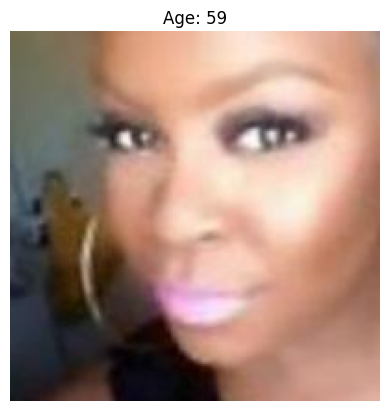

In [ ]:
from PIL import Image

rand_index = random.randint(0, len(image_paths))
age = df['age'][rand_index]
IMG = Image.open(df['image_path'][rand_index])
plt.title(f'Age: {age}')
plt.axis('off')
plt.imshow(IMG)

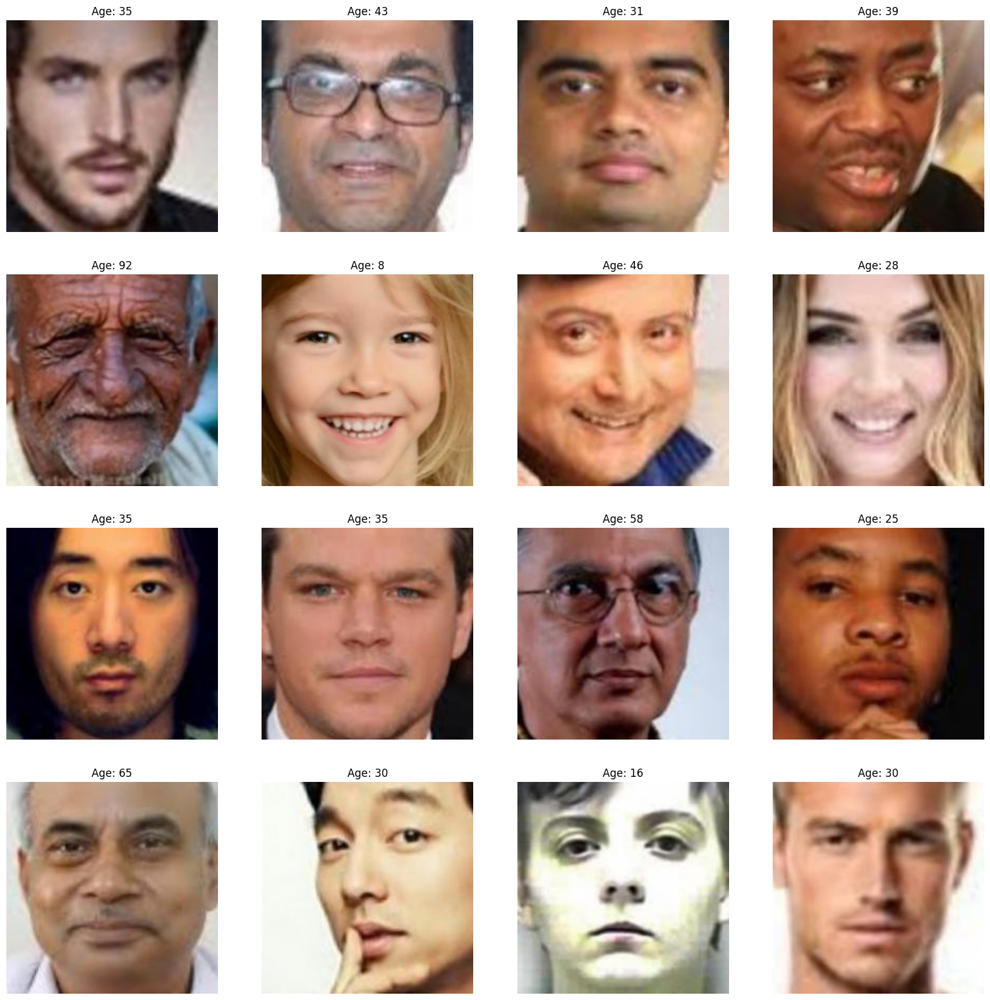

In [ ]:
plt.figure(figsize=(20, 20))
samples = df.iloc[0:16]

for index, sample, age in samples.itertuples():
    plt.subplot(4, 4, index + 1)
    img = load_img(sample)
    img = np.array(img)
    plt.axis('off')
    plt.title(f'Age: {age}')
    plt.imshow(img)

In [ ]:
import cv2
import numpy as np

def calculate_gradient(image):
    gradient_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
    gradient_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
    magnitude = np.sqrt(gradient_x ** 2 + gradient_y ** 2)
    return magnitude

In [ ]:
def extract_image_features(images):
    features = list()

    for image in tqdm(images):
        img = load_img(image, color_mode = "grayscale")
        img = img.resize((128, 128), Image.LANCZOS)
        img = np.array(img)
        img = calculate_gradient(img)
        features.append(img)

    features = np.array(features)
    features = features.reshape(len(features), 128, 128, 1)
    return features

In [ ]:
X = extract_image_features(df['image_path'])

  0%|          | 0/23708 [00:00<?, ?it/s]

In [ ]:
X.shape

(23708, 128, 128, 1)

In [ ]:
X = X / 255.0

In [ ]:
y_age = np.array(df['age'])

NameError: name 'df' is not defined

In [ ]:
input_shape = (128, 128, 1)

In [ ]:
inputs = Input((input_shape))
conv_1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(inputs)
max_1 = MaxPooling2D(pool_size=(2, 2))(conv_1)
conv_2 = Conv2D(64, kernel_size=(3, 3), activation='relu')(max_1)
max_2 = MaxPooling2D(pool_size=(2, 2))(conv_2)
conv_3 = Conv2D(128, kernel_size=(3, 3), activation='relu')(max_2)
max_3 = MaxPooling2D(pool_size=(2, 2))(conv_3)
conv_4 = Conv2D(256, kernel_size=(3, 3), activation='relu')(max_3)
max_4 = MaxPooling2D(pool_size=(2, 2))(conv_4)

flatten = Flatten()(max_4)

# fully connected layers
#dense_1 = Dense(256, activation='relu')(flatten)
dense_2 = Dense(256, activation='relu')(flatten)

#dropout_1 = Dropout(0.3)(dense_1)
dropout_2 = Dropout(0.3)(dense_2)

#output_1 = Dense(1, activation='sigmoid', name='gender_out')(dropout_1)
output_2 = Dense(1, activation='relu', name='age_out')(dropout_2)

model = Model(inputs=[inputs], outputs=[output_2])

model.compile(loss='mae',
              optimizer='adam', metrics=['accuracy'])

# mlflow.log_metric("test_rmse", 10) # error
# mlflow.sklearn.log_model(model, "models")

C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semestr5\MachineLearning\my_env\Lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


In [ ]:
history = model.fit(x=X, y=y_age,
                    batch_size=32, epochs=10, validation_split=0.2)

Epoch 1/10
593/593 [==============================] - 348s 585ms/step - loss: 15.4152 - accuracy: 0.0476 - val_loss: 13.4255 - val_accuracy: 0.0458
Epoch 2/10
593/593 [==============================] - 364s 613ms/step - loss: 11.8287 - accuracy: 0.0412 - val_loss: 10.5809 - val_accuracy: 0.0183
Epoch 3/10
593/593 [==============================] - 341s 575ms/step - loss: 9.9245 - accuracy: 0.0260 - val_loss: 10.5920 - val_accuracy: 0.0093
Epoch 4/10
593/593 [==============================] - 355s 598ms/step - loss: 8.9610 - accuracy: 0.0211 - val_loss: 7.9919 - val_accuracy: 0.0196
Epoch 5/10
593/593 [==============================] - 332s 559ms/step - loss: 8.1436 - accuracy: 0.0192 - val_loss: 7.8119 - val_accuracy: 0.0082
Epoch 6/10
593/593 [==============================] - 367s 619ms/step - loss: 7.6408 - accuracy: 0.0183 - val_loss: 7.2850 - val_accuracy: 0.0074
Epoch 7/10
593/593 [==============================] - 375s 633ms/step - loss: 7.3958 - accuracy: 0.0182 - val_loss: 7.1

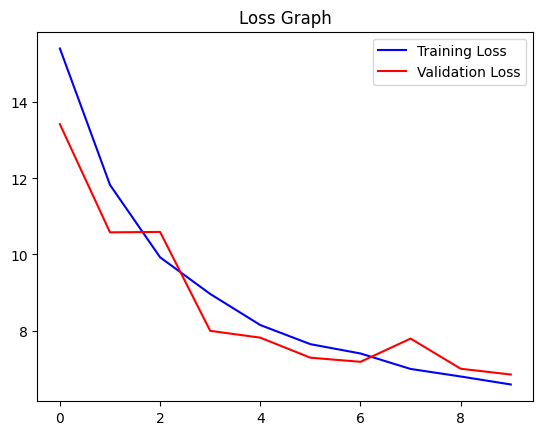

In [ ]:
# plot results for age
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(loss))

plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [ ]:
def get_image_features(image):
  img = load_img(image, grayscale=True)
  img = img.resize((128, 128), Image.LANCZOS)
  img = np.array(img)
  img = img.reshape(1, 128, 128, 1)
  img = img / 255.0
  return img

1/1 [==============================] - 0s 149ms/step


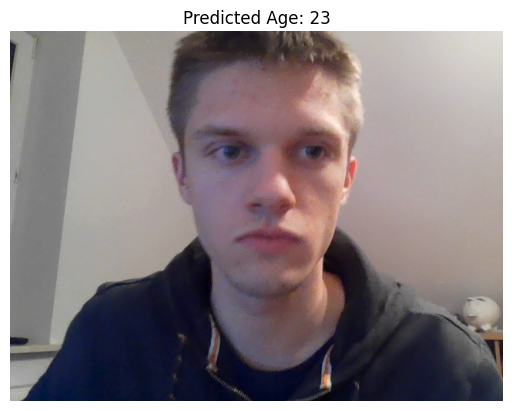

In [ ]:
img_to_test = 'CamData/data/test/images/00bf6f4c-7fdd-11ee-9103-ec773ba9cb5a.jpg'
features = get_image_features(img_to_test)
pred = model.predict(features)
age = round(pred[0][0])

plt.title(f'Predicted Age: {age}')
plt.axis('off')
plt.imshow(np.array(load_img(img_to_test)))

In [ ]:
from tensorflow.keras.models import load_model
model.save('AgeRecognitionModel.keras')

## ANOTHER MODEL

In [ ]:
from move_images_folders import move_images

In [ ]:
BASE_DIR = 'C:\\Users\\kacpe\\OneDrive\\Pulpit\\Uczelnia\\semestr5\\MachineLearning\\UTKFace'

In [ ]:
move_images(BASE_DIR)

In [ ]:
image_filenames = os.listdir(os.path.join(BASE_DIR,'Train'))

In [ ]:
def get_ages_images_paths(image_filenames, folder):
    age_labels = []
    image_paths = []
    for image in tqdm(image_filenames):
        image_path = os.path.join(os.path.join(BASE_DIR, folder), image)
        img_components = image.split('_')
    
        if img_components[0] == '.ipynb':
            continue
        age_label = int(img_components[0])
        
        # Append the image_path, age_label, and gender_label
        age_labels.append(age_label)
        image_paths.append(image_path)
    return age_labels, image_paths

In [ ]:
age_labels, image_paths = get_ages_images_paths(image_filenames, 'Train')

  0%|          | 0/16595 [00:00<?, ?it/s]

In [ ]:
print(f'Number of age_labels: {len(age_labels)}, Number of image_paths: {len(image_paths)}')
import pandas as pd 
df = pd.DataFrame()
df['image_path'], df['age'] = image_paths, age_labels
df.head(5)

Number of age_labels: 16595, Number of image_paths: 16595


,image_path,age
0,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
1,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
2,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
3,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
4,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100


In [ ]:
df['image_path']

0        C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
1        C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
2        C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
3        C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
4        C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
                               ...                        
16590    C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
16591    C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
16592    C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
16593    C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
16594    C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
Name: image_path, Length: 16595, dtype: object

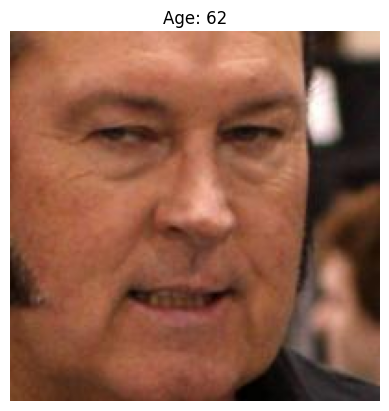

In [ ]:
from PIL import Image

rand_index = random.randint(0, len(image_paths))
age = df['age'][rand_index]
IMG = Image.open(df['image_path'][rand_index])
plt.title(f'Age: {age}')
plt.axis('off')
plt.imshow(IMG)

In [ ]:
X = extract_image_features(df['image_path'])

  0%|          | 0/16595 [00:00<?, ?it/s]

In [ ]:
image_filenames = os.listdir(os.path.join(BASE_DIR,'Val'))

In [ ]:
age_labels_val, image_paths_val = get_ages_images_paths(image_filenames, 'Val')

  0%|          | 0/3557 [00:00<?, ?it/s]

In [ ]:
print(f'Number of age_labels: {len(age_labels_val)}, Number of image_paths: {len(image_paths_val)}')
import pandas as pd 
df_val = pd.DataFrame()
df_val['image_path'],df_val['age'] = image_paths_val, age_labels_val
df_val.head(5)

Number of age_labels: 3557, Number of image_paths: 3557


,image_path,age
0,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
1,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,101
2,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,10
3,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,10
4,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,10


In [ ]:
X_val = extract_image_features(df_val['image_path'])

  0%|          | 0/3557 [00:00<?, ?it/s]

In [ ]:
X_val.shape
X_val = X_val / 255.0
y_age_val = np.array(df_val['age'])

In [ ]:
X.shape
X = X / 255.0
y_age = np.array(df['age'])
input_shape = (128, 128, 1)

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, AveragePooling2D, GlobalAveragePooling2D, Dense

final_cnn = Sequential()

final_cnn.add(Conv2D(filters=32, kernel_size=3, activation='relu', input_shape=input_shape))
final_cnn.add(AveragePooling2D(pool_size=(2,2)))

final_cnn.add(Conv2D(filters=64, kernel_size=3, activation='relu'))
final_cnn.add(AveragePooling2D(pool_size=(2,2)))

final_cnn.add(Conv2D(filters=128, kernel_size=3, activation='relu'))
final_cnn.add(AveragePooling2D(pool_size=(2,2)))

final_cnn.add(Conv2D(filters=256, kernel_size=3, activation='relu'))
final_cnn.add(AveragePooling2D(pool_size=(2,2)))

final_cnn.add(GlobalAveragePooling2D())

final_cnn.add(Dense(132, activation='relu'))

final_cnn.add(Dense(1, activation='linear')) # Predicting a continuous variable

final_cnn.compile(loss='mean_squared_error', optimizer='adam')

final_cnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 126, 126, 32)      320       
                                                                 
 average_pooling2d_4 (Avera  (None, 63, 63, 32)        0         
 gePooling2D)                                                    
                                                                 
 conv2d_5 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 average_pooling2d_5 (Avera  (None, 30, 30, 64)        0         
 gePooling2D)                                                    
                                                                 
 conv2d_6 (Conv2D)           (None, 28, 28, 128)       73856     
                                                                 
 average_pooling2d_6 (Avera  (None, 14, 14, 128)      

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    shear_range=0.2,
    zoom_range=0.2,
    height_shift_range=0.1,
    width_shift_range=0.1,
    rotation_range=15
)

In [ ]:
history = final_cnn.fit(datagen.flow(X, y_age, batch_size=32),
                        steps_per_epoch=len(X) / 32, epochs=60, verbose=1, validation_data=(X_val, y_age_val))

Epoch 1/60
497/497 [==============================] - 105s 208ms/step - loss: 437.6230 - val_loss: 622.4389
Epoch 2/60
497/497 [==============================] - 100s 201ms/step - loss: 399.7627 - val_loss: 529.7137
Epoch 3/60
497/497 [==============================] - 106s 213ms/step - loss: 398.3065 - val_loss: 701.8294
Epoch 4/60
497/497 [==============================] - 105s 211ms/step - loss: 393.1909 - val_loss: 608.5653
Epoch 5/60
497/497 [==============================] - 104s 208ms/step - loss: 394.5312 - val_loss: 533.4412
Epoch 6/60
497/497 [==============================] - 106s 213ms/step - loss: 391.8586 - val_loss: 519.4532
Epoch 7/60
497/497 [==============================] - 102s 204ms/step - loss: 390.0661 - val_loss: 738.3380
Epoch 8/60
497/497 [==============================] - 101s 203ms/step - loss: 385.7003 - val_loss: 493.6299
Epoch 9/60
497/497 [==============================] - 101s 203ms/step - loss: 381.3679 - val_loss: 730.9609
Epoch 10/60
497/497 [=======

In [ ]:
def get_image_features(image):
  img = load_img(image, grayscale=True)
  img = img.resize((224, 224), Image.LANCZOS)
  img = np.array(img)
  img = img.reshape(1, 224, 224, 3)
  img = img / 255.0
  return img

In [ ]:
img_to_test = 'FaceRecognition/CamData/data/test/images/00bf6f4c-7fdd-11ee-9103-ec773ba9cb5a.jpg'
features = get_image_features(img_to_test)
pred = final_cnn.predict(features)

1/1 [==============================] - 0s 23ms/step


In [ ]:
print(pred)
age = round(pred[0][0])


[[58.20982]]


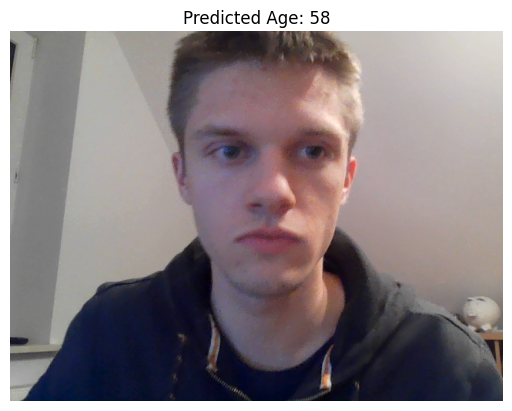

In [ ]:
plt.title(f'Predicted Age: {age}')
plt.axis('off')
plt.imshow(np.array(load_img(img_to_test)))

In [ ]:
from tensorflow.keras.models import load_model
final_cnn.save('BadlyWorkingModel.keras')

## ANOTHER

In [ ]:
input_shape = (128, 128, 1)

In [ ]:
from move_images_folders import move_images

In [ ]:
BASE_DIR = 'C:\\Users\\kacpe\\OneDrive\\Pulpit\\Uczelnia\\semestr5\\MachineLearning\\UTKFace'

In [ ]:
move_images(BASE_DIR, "AugmentedUTKFace")

In [ ]:
image_filenames = os.listdir(os.path.join(BASE_DIR,'Train'))

In [ ]:
age_labels, image_paths = get_ages_images_paths(image_filenames, 'Train')

  0%|          | 0/51665 [00:00<?, ?it/s]

In [ ]:
print(f'Number of age_labels: {len(age_labels)}, Number of image_paths: {len(image_paths)}')
import pandas as pd 
df = pd.DataFrame()
df['image_path'], df['age'] = image_paths, age_labels
df.head(5)

Number of age_labels: 51665, Number of image_paths: 51665


,image_path,age
0,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
1,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
2,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
3,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
4,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100


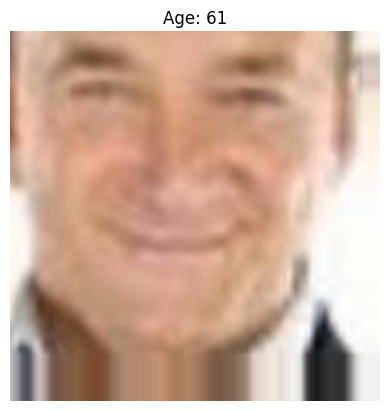

In [ ]:
from PIL import Image

rand_index = random.randint(0, len(image_paths))
age = df['age'][rand_index]
IMG = Image.open(df['image_path'][rand_index])
plt.title(f'Age: {age}')
plt.axis('off')
plt.imshow(IMG)

In [ ]:
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img
from keras.applications.efficientnet import preprocess_input
import numpy as np
import os

In [ ]:
def extract_image_features(images):
    features = list()

    for image in tqdm(images):
        # Load the image in grayscale
        img = load_img(image, color_mode="grayscale")
        # Convert the image to RGB
        img = img.convert("RGB")
        img = img.resize((224, 224), Image.LANCZOS)
        img = img_to_array(img)
        img = preprocess_input(img)
        features.append(img)

    features = np.array(features,dtype='uint8')
    return features

In [ ]:
X = extract_image_features(df['image_path'])

  0%|          | 0/51665 [00:00<?, ?it/s]

In [ ]:
image_filenames = os.listdir(os.path.join(BASE_DIR,'Val'))

In [ ]:
age_labels_val, image_paths_val = get_ages_images_paths(image_filenames, 'Val')

  0%|          | 0/11072 [00:00<?, ?it/s]

In [ ]:
print(f'Number of age_labels: {len(age_labels_val)}, Number of image_paths: {len(image_paths_val)}')
import pandas as pd 
df_val = pd.DataFrame()
df_val['image_path'],df_val['age'] = image_paths_val, age_labels_val
df_val.head(5)

Number of age_labels: 11072, Number of image_paths: 11072


,image_path,age
0,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
1,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
2,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
3,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
4,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100


In [ ]:
X_val = extract_image_features(df_val['image_path'])

  0%|          | 0/11072 [00:00<?, ?it/s]

In [ ]:
X_val.shape

(11072, 224, 224, 3)

In [ ]:
y_age_val = np.array(df_val['age'])

In [ ]:
y_age = np.array(df['age'])

In [ ]:
input_shape = (224, 224, 3)


from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

# Load the EfficientNetB0 model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the base model
base_model.trainable = False

# Add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)

# Add a fully-connected layer
x = Dense(1024, activation='relu')(x)

# Add a logistic layer for age prediction
predictions = Dense(1, activation='linear')(x)

# This is the model we will train
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Print a summary of the model
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 224, 224, 3)          7         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 rescaling_1 (Rescaling)     (None, 224, 224, 3)          0         ['normalization[0][0]']   

In [ ]:
model.fit(X, y_age, epochs=9, batch_size=32, validation_data=(X_val, y_age_val))
# history = final_cnn.fit(datagen.flow(X, y_age, batch_size=32),
#                         steps_per_epoch=len(X) / 32, epochs=60, verbose=1, validation_data=(X_val, y_age_val))

Epoch 1/9
1615/1615 [==============================] - 2703s 2s/step - loss: 178.4542 - val_loss: 138.3761
Epoch 2/9
1615/1615 [==============================] - 6125s 4s/step - loss: 138.9834 - val_loss: 131.7892
Epoch 3/9
1615/1615 [==============================] - 3135s 2s/step - loss: 128.2680 - val_loss: 117.2372
Epoch 4/9
1615/1615 [==============================] - 1336s 827ms/step - loss: 121.3367 - val_loss: 112.4200
Epoch 5/9
1615/1615 [==============================] - 1332s 825ms/step - loss: 115.3387 - val_loss: 110.1497
Epoch 6/9
1615/1615 [==============================] - 1331s 824ms/step - loss: 109.5670 - val_loss: 107.1246
Epoch 7/9
1615/1615 [==============================] - 1356s 840ms/step - loss: 104.5487 - val_loss: 113.3910
Epoch 8/9
1615/1615 [==============================] - 1370s 848ms/step - loss: 100.0799 - val_loss: 100.6408
Epoch 9/9
1615/1615 [==============================] - 1367s 847ms/step - loss: 95.3003 - val_loss: 98.5089


In [ ]:
model.save('EfficientNet.keras')

In [ ]:
from keras.models import load_model

In [ ]:
model = load_model('EfficientNet.keras')

In [ ]:
model.fit(X, y_age, epochs=25, batch_size=32, validation_data=(X_val, y_age_val))

Epoch 1/25
1615/1615 [==============================] - 2283s 1s/step - loss: 50.9290 - val_loss: 73.8072
Epoch 2/25
1615/1615 [==============================] - 1382s 856ms/step - loss: 49.5741 - val_loss: 75.8213
Epoch 3/25
1615/1615 [==============================] - 1381s 855ms/step - loss: 50.1321 - val_loss: 76.1962
Epoch 4/25
1615/1615 [==============================] - 1386s 858ms/step - loss: 48.0255 - val_loss: 75.3372
Epoch 5/25
1615/1615 [==============================] - 1452s 899ms/step - loss: 47.0380 - val_loss: 76.1953
Epoch 6/25
1615/1615 [==============================] - 1385s 858ms/step - loss: 45.9349 - val_loss: 74.3696
Epoch 7/25
1615/1615 [==============================] - 1379s 854ms/step - loss: 46.0928 - val_loss: 74.6137
Epoch 8/25
1615/1615 [==============================] - 1380s 855ms/step - loss: 45.1137 - val_loss: 73.5338
Epoch 9/25
1615/1615 [==============================] - 1386s 858ms/step - loss: 43.9478 - val_loss: 80.7504
Epoch 10/25
1615/1615 

In [ ]:
def get_image_features(image):
    img = load_img(image, target_size=(224, 224))
    img = np.array(img)
    img = img / 255.0
    img = np.expand_dims(img, axis=0)
    return img

In [ ]:
model.fit(X, y_age, epochs=2, batch_size=32, validation_data=(X_val, y_age_val))

Epoch 1/2
 295/1615 [====>.........................] - ETA: 18:02 - loss: 34.8866

KeyboardInterrupt: 

In [ ]:
img_to_test = 'FaceRecognition/CamData/data/test/images/00bf6f4c-7fdd-11ee-9103-ec773ba9cb5a.jpg'
features = get_image_features(img_to_test)
pred = model.predict(features)

1/1 [==============================] - 0s 104ms/step


In [ ]:
print(pred)

[[38.04507]]


In [ ]:
model.save('EfficientNet2.keras')

In [ ]:
model.fit(X, y_age, epochs=9, batch_size=32, validation_data=(X_val, y_age_val))

In [ ]:
model.fit(X, y_age, epochs=9, batch_size=32, validation_data=(X_val, y_age_val))

In [ ]:
model.save('EfficientNet5.keras')

In [ ]:
BASE_DIR = 'C:\\Users\\User\\Desktop\\Szkoła\\MachineLearning\\AgeRecognition'

In [ ]:
train_labels = []
train_paths = []

train_filenames = os.listdir(os.path.join(BASE_DIR, "Train"))
random.shuffle(train_filenames)

train_filenames = train_filenames
train_filenames[0]

'80_0_2_20170112215149951.jpg.chip.jpg'

In [ ]:
val_labels = []
val_paths = []

val_filenames = os.listdir(os.path.join(BASE_DIR, "Val"))
random.shuffle(val_filenames)

val_filenames = val_filenames
val_filenames[0]

'51_0_2_20170116192859594.jpg.chip.jpg'

In [ ]:
test_labels = []
test_paths = []

test_filenames = os.listdir(os.path.join(BASE_DIR, "Test"))
random.shuffle(test_filenames)

test_filenames = test_filenames
test_filenames[0]

'85_0_0_20170111210445676.jpg.chip.jpg'

In [ ]:
def get_paths_and_labels(image_filenames, age_labels, image_paths, folder):
    for image in tqdm(image_filenames):
        image_path = os.path.join(BASE_DIR, folder, image)
        img_components = image.split('_')
    
        if img_components[0] == '.ipynb':
            continue
        age_label = int(img_components[0])
        
        # Append the image_path, age_label, and gender_label
        age_labels.append(age_label)
        image_paths.append(image_path)

In [ ]:
get_paths_and_labels(train_filenames, train_labels, train_paths, "Train")
get_paths_and_labels(val_filenames, val_labels, val_paths, "Val")
get_paths_and_labels(test_filenames, test_labels, test_paths, "Test")

  0%|          | 0/7380 [00:00<?, ?it/s]

  0%|          | 0/1583 [00:00<?, ?it/s]

  0%|          | 0/1581 [00:00<?, ?it/s]

In [ ]:
print(f'Number of age_labels: {len(train_labels)}, Number of image_paths: {len(train_paths)}')

Number of age_labels: 7380, Number of image_paths: 7380


In [ ]:
train_df = pd.DataFrame()
train_df['image_path'], train_df['age'] = train_paths, train_labels
train_df.head(5)

,image_path,age
0,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,80
1,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,53
2,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,70
3,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,75
4,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,43


In [ ]:
val_df = pd.DataFrame()
val_df['image_path'], val_df['age'] = val_paths, val_labels
val_df.head(5)

,image_path,age
0,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,51
1,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,17
2,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,72
3,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,47
4,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,56


In [ ]:
test_df = pd.DataFrame()
test_df['image_path'], test_df['age'] = test_paths, test_labels
test_df.head(5)

,image_path,age
0,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,85
1,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,18
2,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,19
3,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,47
4,C:\Users\User\Desktop\Szkoła\MachineLearning\A...,65


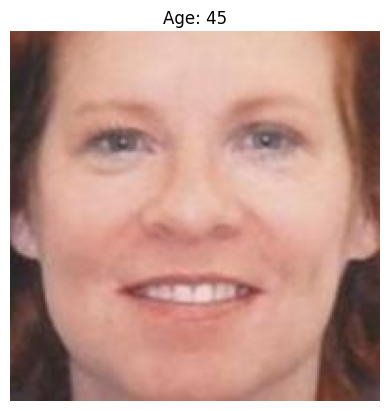

In [ ]:
from PIL import Image

rand_index = random.randint(0, len(val_paths))
age = val_df['age'][rand_index]
IMG = Image.open(val_df['image_path'][rand_index])
plt.title(f'Age: {age}')
plt.axis('off')
plt.imshow(IMG)

In [ ]:
del train_paths, train_labels, val_paths, val_labels, test_paths, test_labels
gc.collect()

41499

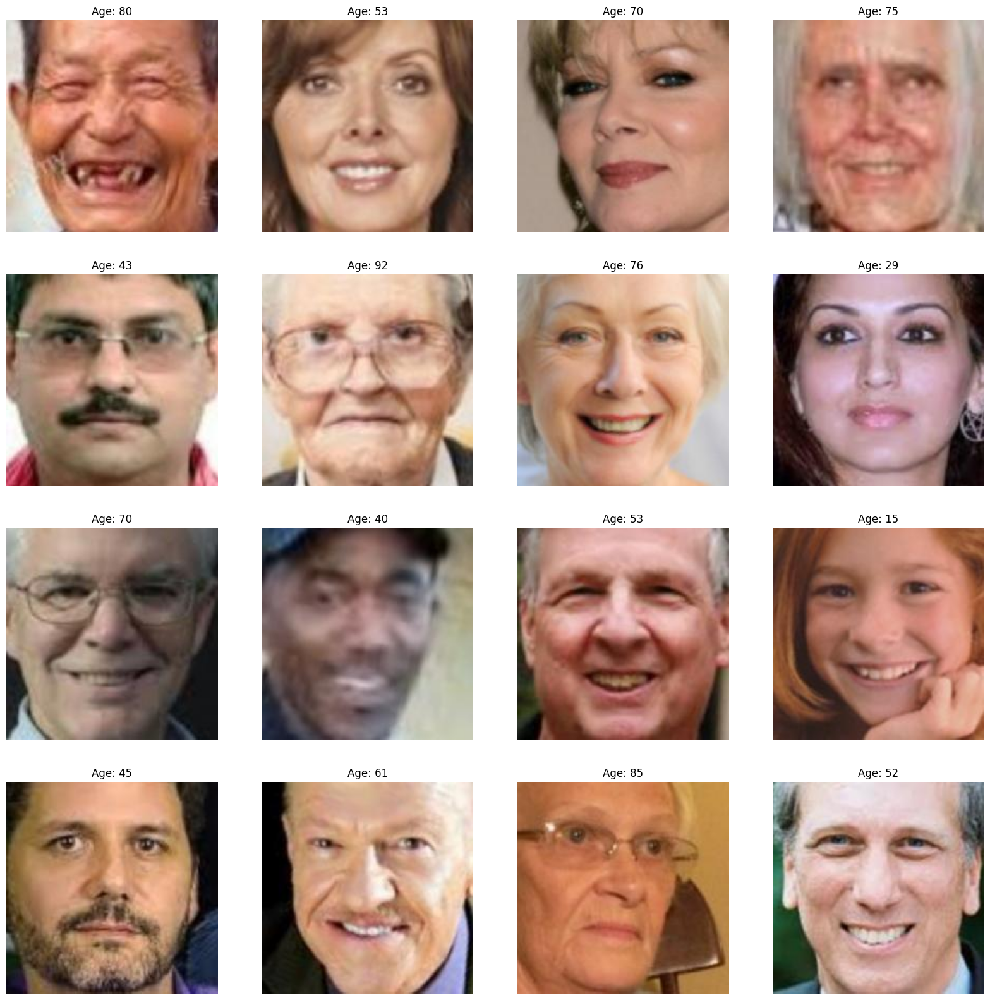

In [ ]:
plt.figure(figsize=(20, 20))
samples = train_df.iloc[0:16]

for index, sample, age in samples.itertuples():
    plt.subplot(4, 4, index + 1)
    img = load_img(sample)
    img = np.array(img)
    plt.axis('off')
    plt.title(f'Age: {age}')
    plt.imshow(img)

In [ ]:
input_width = 180
input_height = 180

In [ ]:
def extract_image_features(images, width, height):
    features = list()

    for image in tqdm(images):
        img = load_img(image)
        img = img.resize((width, height), Image.LANCZOS)
        img = np.array(img)
        features.append(img)

    features = np.array(features, dtype='uint8')
    features = features.reshape(len(features), width, height, 3)
    return features

In [ ]:
def extract_image_features(images, width, height):
    features = list()

    for image in tqdm(images):
        img = load_img(image)
        img = img.resize((width, height), Image.LANCZOS)
        img = np.array(img)
        features.append(img)

    features = np.array(features, dtype='uint8')
    features = features.reshape(len(features), width, height, 3)
    return features

In [ ]:
X_train = extract_image_features(train_df['image_path'], input_width, input_height)
X_val = extract_image_features(val_df['image_path'], input_width, input_height)
X_test = extract_image_features(test_df['image_path'], input_width, input_height)

  0%|          | 0/7380 [00:00<?, ?it/s]

  0%|          | 0/1583 [00:00<?, ?it/s]

  0%|          | 0/1581 [00:00<?, ?it/s]

In [ ]:
y_age_train = np.array(train_df['age'])
y_age_val = np.array(val_df['age'])
y_age_test = np.array(test_df['age'])

In [ ]:
del train_df, val_df, test_df
gc.collect()

37731

In [ ]:
X_train.shape

(7380, 180, 180, 3)

In [ ]:
X_train = X_train / 255.0
X_val = X_val / 255.0
X_test = X_test / 255.0

In [ ]:
input_shape = (input_width, input_height, 3)

In [ ]:
inputs = Input((input_shape))
conv_1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(inputs)
max_1 = MaxPooling2D(pool_size=(2, 2))(conv_1)
conv_2 = Conv2D(64, kernel_size=(3, 3), activation='relu')(max_1)
max_2 = MaxPooling2D(pool_size=(2, 2))(conv_2)
conv_3 = Conv2D(128, kernel_size=(3, 3), activation='relu')(max_2)
max_3 = MaxPooling2D(pool_size=(2, 2))(conv_3)
conv_4 = Conv2D(256, kernel_size=(3, 3), activation='relu')(max_3)
max_4 = MaxPooling2D(pool_size=(2, 2))(conv_4)

flatten = Flatten()(max_4)

dense = Dense(256, activation='relu')(flatten)
dropout = Dropout(0.3)(dense)

output = Dense(1, activation='relu', name='age_out')(dropout)

model = Model(inputs=[inputs], outputs=[output])

model.compile(loss='mae',
              optimizer='adam', metrics=['accuracy'])

# mlflow.log_metric("test_rmse", 10) # error
# mlflow.sklearn.log_model(model, "models")

In [ ]:
model = load_model('AgeRecognitionModel_v3.keras')

In [ ]:
history = model.fit(x=X_train, y=y_age_train,
                    batch_size=32, epochs=10, validation_data=(X_val, y_age_val))

Epoch 1/10
231/231 [==============================] - 156s 670ms/step - loss: 21.9686 - accuracy: 0.0425 - val_loss: 19.9399 - val_accuracy: 0.0480
Epoch 2/10
231/231 [==============================] - 150s 651ms/step - loss: 16.9879 - accuracy: 0.0397 - val_loss: 14.2525 - val_accuracy: 0.0335
Epoch 3/10
231/231 [==============================] - 149s 644ms/step - loss: 13.8784 - accuracy: 0.0268 - val_loss: 13.9892 - val_accuracy: 0.0164
Epoch 4/10
231/231 [==============================] - 144s 623ms/step - loss: 12.5321 - accuracy: 0.0175 - val_loss: 10.8792 - val_accuracy: 0.0158
Epoch 5/10
231/231 [==============================] - 144s 623ms/step - loss: 11.4019 - accuracy: 0.0157 - val_loss: 9.9952 - val_accuracy: 0.0164
Epoch 6/10
231/231 [==============================] - 144s 625ms/step - loss: 10.7362 - accuracy: 0.0099 - val_loss: 9.4936 - val_accuracy: 0.0126
Epoch 7/10
231/231 [==============================] - 144s 625ms/step - loss: 10.1022 - accuracy: 0.0126 - val_los

In [ ]:
from tensorflow.keras.models import load_model
model.save('AgeRecognitionModel_v88.keras')

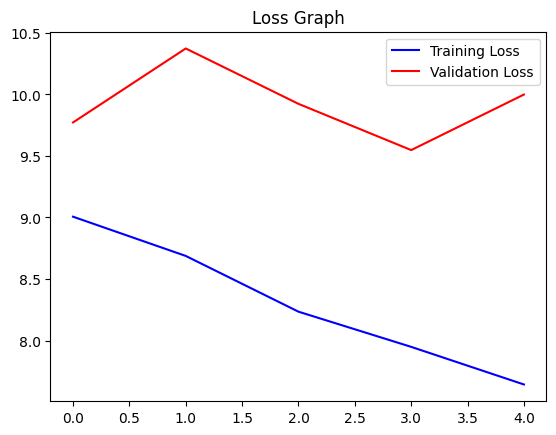

In [ ]:
# plot results for age
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(loss))

plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [ ]:
def get_image_features(image, width, height):
  img = load_img(image)
  img = img.resize((width, height), Image.LANCZOS)
  img = np.array(img)
  img = img.reshape(1, width, height, 3)
  img = img / 255.0
  return img

1/1 [==============================] - 0s 90ms/step


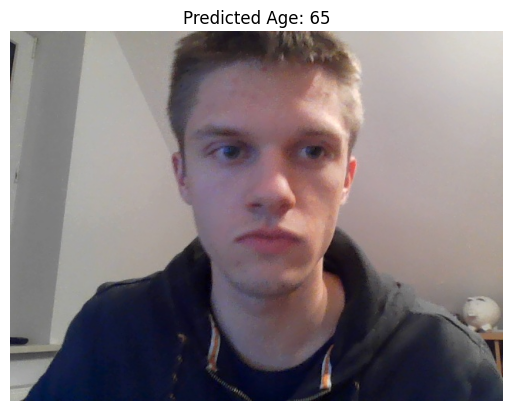

In [ ]:
img_to_test = 'FaceRecognition/CamData/data/test/images/00bf6f4c-7fdd-11ee-9103-ec773ba9cb5a.jpg'
features = get_image_features(img_to_test, input_width, input_height)
pred = model.predict(features)
age = round(pred[0][0])

plt.title(f'Predicted Age: {age}')
plt.axis('off')
plt.imshow(np.array(load_img(img_to_test)))

## ANOTHER MODEL (different edge detection)


In [ ]:
input_width = 200
input_height = 200

In [ ]:
import cv2
import numpy as np
from keras.preprocessing import image

def canny_edge_detection(image):
    # Konwersja obrazu na skale szarości
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Zastosowanie detekcji krawędzi Canny
    edges = cv2.Canny(gray_image, threshold1=30, threshold2=100)
    
    return edges

def extract_image_features(images, width, height):
    features = list()

    for image in tqdm(images):
        img = load_img(image)
        img = img.resize((width, height), Image.LANCZOS)
        img = np.array(img)
        
        # Stosowanie detekcji krawędzi Canny
        img = canny_edge_detection(img)
        
        # Przekształcanie obrazu na skale szarości
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        
        features.append(img)

    features = np.array(features, dtype='uint8')
    features = features.reshape(len(features), width, height, 3)
    return features

In [ ]:
X_train = extract_image_features(train_df['image_path'], input_width, input_height)
X_val = extract_image_features(val_df['image_path'], input_width, input_height)
X_test = extract_image_features(test_df['image_path'], input_width, input_height)

  0%|          | 0/7380 [00:00<?, ?it/s]

  0%|          | 0/1583 [00:00<?, ?it/s]

  0%|          | 0/1581 [00:00<?, ?it/s]

In [ ]:
y_age_train = np.array(train_df['age'])
y_age_val = np.array(val_df['age'])
y_age_test = np.array(test_df['age'])

In [ ]:
del train_df, val_df, test_df
gc.collect()

37687

In [ ]:
X_train = X_train / 255.0
X_val = X_val / 255.0
X_test = X_test / 255.0

In [ ]:
input_shape = (input_width, input_height, 3)

In [ ]:
inputs = Input((input_shape))
conv_1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(inputs)
max_1 = MaxPooling2D(pool_size=(2, 2))(conv_1)
conv_2 = Conv2D(64, kernel_size=(3, 3), activation='relu')(max_1)
max_2 = MaxPooling2D(pool_size=(2, 2))(conv_2)
conv_3 = Conv2D(128, kernel_size=(3, 3), activation='relu')(max_2)
max_3 = MaxPooling2D(pool_size=(2, 2))(conv_3)
conv_4 = Conv2D(256, kernel_size=(3, 3), activation='relu')(max_3)
max_4 = MaxPooling2D(pool_size=(2, 2))(conv_4)

flatten = Flatten()(max_4)

dense = Dense(256, activation='relu')(flatten)
dropout = Dropout(0.3)(dense)

output = Dense(1, activation='relu', name='age_out')(dropout)

model = Model(inputs=[inputs], outputs=[output])

model.compile(loss='mae',
              optimizer='adam', metrics=['accuracy'])

# mlflow.log_metric("test_rmse", 10) # error
# mlflow.sklearn.log_model(model, "models")

In [ ]:
history = model.fit(x=X_train, y=y_age_train,
                    batch_size=32, epochs=10, validation_data=(X_val, y_age_val))

Epoch 1/10
231/231 [==============================] - 194s 827ms/step - loss: 16.6141 - accuracy: 0.0404 - val_loss: 14.3439 - val_accuracy: 0.0480
Epoch 2/10
231/231 [==============================] - 183s 791ms/step - loss: 13.0555 - accuracy: 0.0308 - val_loss: 11.7810 - val_accuracy: 0.0379
Epoch 3/10
231/231 [==============================] - 181s 785ms/step - loss: 11.9670 - accuracy: 0.0263 - val_loss: 12.2795 - val_accuracy: 0.0297
Epoch 4/10
231/231 [==============================] - 182s 790ms/step - loss: 10.9125 - accuracy: 0.0221 - val_loss: 10.9641 - val_accuracy: 0.0253
Epoch 5/10
231/231 [==============================] - 181s 785ms/step - loss: 10.0724 - accuracy: 0.0218 - val_loss: 10.5454 - val_accuracy: 0.0158
Epoch 6/10
231/231 [==============================] - 181s 784ms/step - loss: 9.3872 - accuracy: 0.0213 - val_loss: 10.1734 - val_accuracy: 0.0177
Epoch 7/10
231/231 [==============================] - 183s 791ms/step - loss: 8.7499 - accuracy: 0.0199 - val_los

In [ ]:
from tensorflow.keras.models import load_model
model.save('AgeRecognitionModel_v111.keras')

## another model

In [ ]:
input_width = 180
input_height = 180

In [ ]:
import cv2
import numpy as np
from keras.preprocessing import image

def canny_edge_detection(image):
    # Konwersja obrazu na skale szarości
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Zastosowanie detekcji krawędzi Canny
    edges = cv2.Canny(gray_image, threshold1=30, threshold2=100)
    
    return edges

def extract_image_features(images, width, height):
    features = list()

    for image in tqdm(images):
        img = load_img(image)
        img = img.resize((width, height), Image.LANCZOS)
        img = np.array(img)
        
        # Stosowanie detekcji krawędzi Canny
        img = canny_edge_detection(img)
        
        # Przekształcanie obrazu na skale szarości
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        
        features.append(img)

    features = np.array(features, dtype='uint8')
    features = features.reshape(len(features), width, height, 3)
    return features

In [ ]:
X_train = extract_image_features(train_df['image_path'], input_width, input_height)
X_val = extract_image_features(val_df['image_path'], input_width, input_height)
X_test = extract_image_features(test_df['image_path'], input_width, input_height)

  0%|          | 0/7380 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
y_age_train = np.array(train_df['age'])
y_age_val = np.array(val_df['age'])
y_age_test = np.array(test_df['age'])

In [ ]:
X_train = X_train / 255.0
X_val = X_val / 255.0
X_test = X_test / 255.0

In [ ]:
input_shape = (input_width, input_height, 3)

In [ ]:
inputs = Input((input_shape))
conv_1 = Conv2D(8, kernel_size=(3, 3), activation='relu')(inputs)
max_1 = MaxPooling2D(pool_size=(2, 2))(conv_1)
conv_1 = Conv2D(16, kernel_size=(3, 3), activation='relu')(inputs)
max_1 = MaxPooling2D(pool_size=(2, 2))(conv_1)
conv_1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(inputs)
max_1 = MaxPooling2D(pool_size=(2, 2))(conv_1)
conv_2 = Conv2D(64, kernel_size=(3, 3), activation='relu')(max_1)
max_2 = MaxPooling2D(pool_size=(2, 2))(conv_2)
conv_3 = Conv2D(128, kernel_size=(3, 3), activation='relu')(max_2)
max_3 = MaxPooling2D(pool_size=(2, 2))(conv_3)
conv_4 = Conv2D(256, kernel_size=(3, 3), activation='relu')(max_3)
max_4 = MaxPooling2D(pool_size=(2, 2))(conv_4)

flatten = Flatten()(max_4)

dense = Dense(512, activation='relu')(flatten)
dropout = Dropout(0.5)(dense)

dense = Dense(256, activation='relu')(flatten)
dropout = Dropout(0.3)(dense)

output = Dense(1, activation='relu', name='age_out')(dropout)

model = Model(inputs=[inputs], outputs=[output])

model.compile(loss='mae',
              optimizer='adam', metrics=['accuracy'])

# mlflow.log_metric("test_rmse", 10) # error
# mlflow.sklearn.log_model(model, "models")

In [ ]:
history = model.fit(x=X_train, y=y_age_train,
                    batch_size=32, epochs=10, validation_data=(X_val, y_age_val))

Epoch 1/10
231/231 [==============================] - 150s 640ms/step - loss: 18.3213 - accuracy: 0.0415 - val_loss: 13.4666 - val_accuracy: 0.0480
Epoch 2/10
231/231 [==============================] - 150s 648ms/step - loss: 13.6816 - accuracy: 0.0378 - val_loss: 12.1059 - val_accuracy: 0.0442
Epoch 3/10
231/231 [==============================] - 147s 638ms/step - loss: 12.5597 - accuracy: 0.0316 - val_loss: 11.0822 - val_accuracy: 0.0347
Epoch 4/10
231/231 [==============================] - 144s 625ms/step - loss: 11.1852 - accuracy: 0.0248 - val_loss: 10.5279 - val_accuracy: 0.0152
Epoch 5/10
231/231 [==============================] - 144s 624ms/step - loss: 10.4696 - accuracy: 0.0228 - val_loss: 11.0003 - val_accuracy: 0.0164
Epoch 6/10
231/231 [==============================] - 143s 619ms/step - loss: 9.8296 - accuracy: 0.0207 - val_loss: 9.6776 - val_accuracy: 0.0215
Epoch 7/10
231/231 [==============================] - 144s 622ms/step - loss: 9.3486 - accuracy: 0.0195 - val_loss

## another model

In [ ]:
def extract_image_features(images, width, height):
    features = list()

    for image in tqdm(images):
        img = load_img(image)
        img = img.resize((width, height), Image.LANCZOS)
        img = np.array(img)
        features.append(img)

    features = np.array(features, dtype='uint8')
    features = features.reshape(len(features), width, height, 3)
    return features

In [ ]:
X_train = extract_image_features(train_df['image_path'], input_width, input_height)
X_val = extract_image_features(val_df['image_path'], input_width, input_height)
X_test = extract_image_features(test_df['image_path'], input_width, input_height)

  0%|          | 0/7380 [00:00<?, ?it/s]

  0%|          | 0/1583 [00:00<?, ?it/s]

  0%|          | 0/1581 [00:00<?, ?it/s]

In [ ]:
y_age_train = np.array(train_df['age'])
y_age_val = np.array(val_df['age'])
y_age_test = np.array(test_df['age'])

In [ ]:
X_train = X_train / 255.0
X_val = X_val / 255.0
X_test = X_test / 255.0

In [ ]:
input_shape = (input_width, input_height, 3)

In [ ]:
print(input_shape)

(180, 180, 3)


In [ ]:
inputs = Input((input_shape))
conv_1 = Conv2D(8, kernel_size=(3, 3), activation='relu')(inputs)
max_1 = MaxPooling2D(pool_size=(2, 2))(conv_1)
conv_1 = Conv2D(16, kernel_size=(3, 3), activation='relu')(inputs)
max_1 = MaxPooling2D(pool_size=(2, 2))(conv_1)
conv_1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(inputs)
max_1 = MaxPooling2D(pool_size=(2, 2))(conv_1)
conv_2 = Conv2D(64, kernel_size=(3, 3), activation='relu')(max_1)
max_2 = MaxPooling2D(pool_size=(2, 2))(conv_2)
conv_3 = Conv2D(128, kernel_size=(3, 3), activation='relu')(max_2)
max_3 = MaxPooling2D(pool_size=(2, 2))(conv_3)
conv_4 = Conv2D(256, kernel_size=(3, 3), activation='relu')(max_3)
max_4 = MaxPooling2D(pool_size=(2, 2))(conv_4)

flatten = Flatten()(max_4)

dense = Dense(512, activation='relu')(flatten)
dropout = Dropout(0.5)(dense)

dense = Dense(256, activation='relu')(flatten)
dropout = Dropout(0.3)(dense)

output = Dense(1, activation='relu', name='age_out')(dropout)

model = Model(inputs=[inputs], outputs=[output])

model.compile(loss='mae',
              optimizer='adam', metrics=['accuracy'])

# mlflow.log_metric("test_rmse", 10) # error
# mlflow.sklearn.log_model(model, "models")

In [ ]:
history = model.fit(x=X_train, y=y_age_train,
                    batch_size=32, epochs=10, validation_data=(X_val, y_age_val))

Epoch 1/10
231/231 [==============================] - 233s 1s/step - loss: 21.0861 - accuracy: 0.0421 - val_loss: 17.0711 - val_accuracy: 0.0480
Epoch 2/10
231/231 [==============================] - 177s 766ms/step - loss: 16.3955 - accuracy: 0.0419 - val_loss: 14.0897 - val_accuracy: 0.0411
Epoch 3/10
231/231 [==============================] - 155s 627ms/step - loss: 13.7345 - accuracy: 0.0343 - val_loss: 12.3803 - val_accuracy: 0.0310
Epoch 4/10
231/231 [==============================] - 157s 682ms/step - loss: 12.3666 - accuracy: 0.0232 - val_loss: 10.2689 - val_accuracy: 0.0120
Epoch 5/10
231/231 [==============================] - 144s 625ms/step - loss: 11.3734 - accuracy: 0.0153 - val_loss: 10.5792 - val_accuracy: 0.0190
Epoch 6/10
231/231 [==============================] - 147s 635ms/step - loss: 10.7518 - accuracy: 0.0122 - val_loss: 10.0376 - val_accuracy: 0.0107
Epoch 7/10
231/231 [==============================] - 144s 625ms/step - loss: 10.2119 - accuracy: 0.0107 - val_loss

In [ ]:
model.save('AgeRecognitionModel_v222.keras')

In [ ]:
history = model.fit(x=X_train, y=y_age_train,
                    batch_size=32, epochs=2, validation_data=(X_val, y_age_val))

Epoch 1/2
231/231 [==============================] - 379s 2s/step - loss: 8.4477 - accuracy: 0.0065 - val_loss: 8.3754 - val_accuracy: 0.0057
Epoch 2/2
231/231 [==============================] - 160s 694ms/step - loss: 8.1257 - accuracy: 0.0076 - val_loss: 8.2074 - val_accuracy: 0.0095


In [ ]:
history = model.fit(x=X_train, y=y_age_train,
                    batch_size=32, epochs=4, validation_data=(X_val, y_age_val))

MemoryError: Unable to allocate 2.67 GiB for an array with shape (7380, 180, 180, 3) and data type float32

In [ ]:
history = model.fit(x=X_train, y=y_age_train,
                    batch_size=32, epochs=10, validation_data=(X_val, y_age_val))

In [ ]:
model.save('AgeRecognitionModel_v222.keras')

In [2]:
BASE_DIR = 'C:\\Users\\kacpe\\OneDrive\\Pulpit\\Uczelnia\\semestr5\\MachineLearning\\UTKFace\\UTKFace'
age_labels = []
image_paths = []

image_filenames = os.listdir(BASE_DIR)
random.shuffle(image_filenames)

image_filenames[0]

'27_0_0_20170117114918781.jpg.chip.jpg'

In [14]:
from move_images_folders import move_images

In [15]:
move_images(BASE_DIR)

FileNotFoundError: [WinError 3] System nie może odnaleźć określonej ścieżki: 'C:\\Users\\kacpe\\OneDrive\\Pulpit\\Uczelnia\\semestr5\\MachineLearning\\UTKFace\\UTKFace\\UTKFace'

In [3]:
for image in tqdm(image_filenames):
    image_path = os.path.join(BASE_DIR, image)
    img_components = image.split('_')

    if img_components[0] == '.ipynb':
        continue
    age_label = int(img_components[0])
    
    # Append the image_path, age_label, and gender_label
    age_labels.append(age_label)
    image_paths.append(image_path)

  0%|          | 0/23708 [00:00<?, ?it/s]

In [4]:
print(f'Number of age_labels: {len(age_labels)}, Number of image_paths: {len(image_paths)}')

Number of age_labels: 23708, Number of image_paths: 23708


In [5]:
import pandas as pd 
df = pd.DataFrame()
df['image_path'], df['age'] = image_paths, age_labels
df.head(5)

,image_path,age
0,C:\Users\micha\GitRepos\AgeRecognition(ML)\UTK...,35
1,C:\Users\micha\GitRepos\AgeRecognition(ML)\UTK...,43
2,C:\Users\micha\GitRepos\AgeRecognition(ML)\UTK...,31
3,C:\Users\micha\GitRepos\AgeRecognition(ML)\UTK...,39
4,C:\Users\micha\GitRepos\AgeRecognition(ML)\UTK...,92


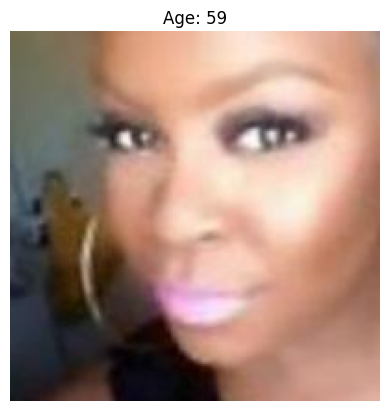

In [6]:
from PIL import Image

rand_index = random.randint(0, len(image_paths))
age = df['age'][rand_index]
IMG = Image.open(df['image_path'][rand_index])
plt.title(f'Age: {age}')
plt.axis('off')
plt.imshow(IMG)

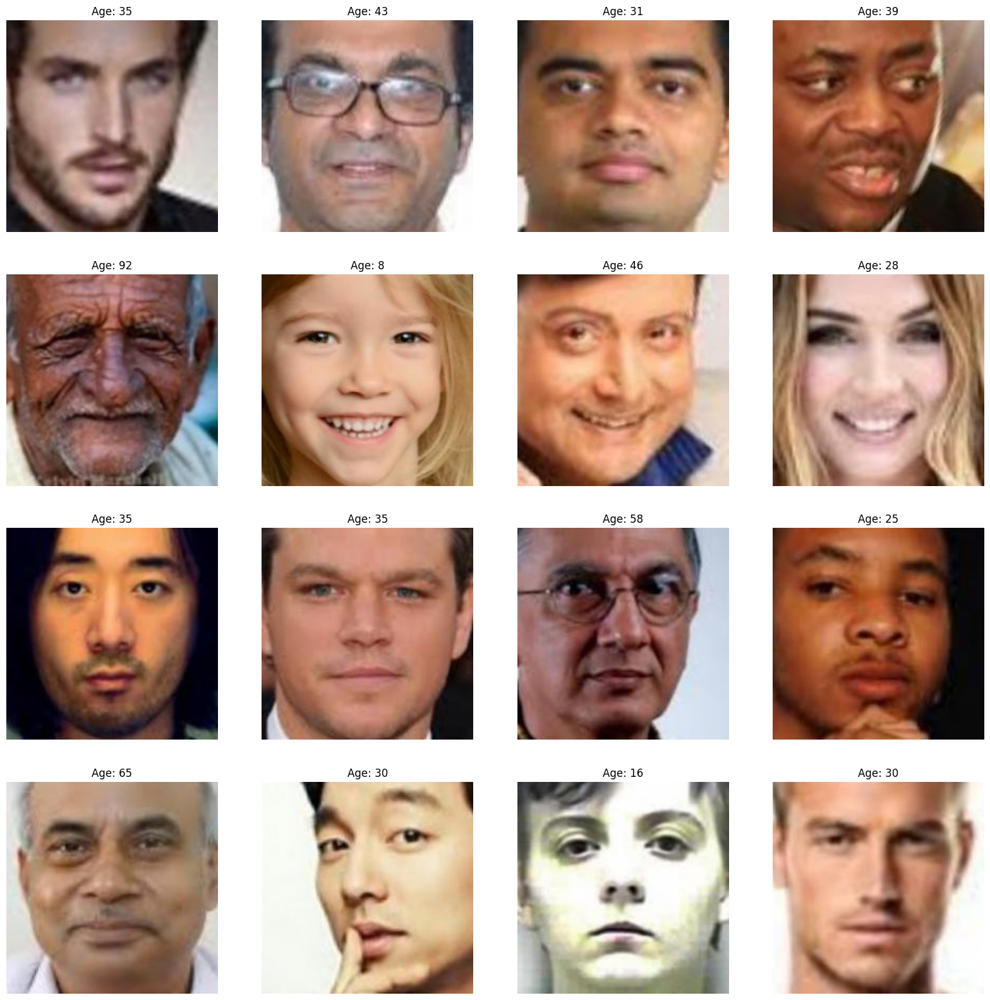

In [7]:
plt.figure(figsize=(20, 20))
samples = df.iloc[0:16]

for index, sample, age in samples.itertuples():
    plt.subplot(4, 4, index + 1)
    img = load_img(sample)
    img = np.array(img)
    plt.axis('off')
    plt.title(f'Age: {age}')
    plt.imshow(img)

In [16]:
def extract_image_features(images):
    features = list()

    for image in tqdm(images):
        img = load_img(image, color_mode = "grayscale")
        img = img.resize((128, 128), Image.LANCZOS)
        img = np.array(img)
        features.append(img)

    features = np.array(features)
    features = features.reshape(len(features), 128, 128, 1)
    return features

In [11]:
X = extract_image_features(df['image_path'])

  0%|          | 0/23708 [00:00<?, ?it/s]

In [12]:
X.shape

(23708, 128, 128, 1)

In [13]:
X = X / 255.0

In [7]:
y_age = np.array(df['age'])

NameError: name 'df' is not defined

In [8]:
input_shape = (128, 128, 1)

In [9]:
inputs = Input((input_shape))
conv_1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(inputs)
max_1 = MaxPooling2D(pool_size=(2, 2))(conv_1)
conv_2 = Conv2D(64, kernel_size=(3, 3), activation='relu')(max_1)
max_2 = MaxPooling2D(pool_size=(2, 2))(conv_2)
conv_3 = Conv2D(128, kernel_size=(3, 3), activation='relu')(max_2)
max_3 = MaxPooling2D(pool_size=(2, 2))(conv_3)
conv_4 = Conv2D(256, kernel_size=(3, 3), activation='relu')(max_3)
max_4 = MaxPooling2D(pool_size=(2, 2))(conv_4)

flatten = Flatten()(max_4)

# fully connected layers
#dense_1 = Dense(256, activation='relu')(flatten)
dense_2 = Dense(256, activation='relu')(flatten)

#dropout_1 = Dropout(0.3)(dense_1)
dropout_2 = Dropout(0.3)(dense_2)

#output_1 = Dense(1, activation='sigmoid', name='gender_out')(dropout_1)
output_2 = Dense(1, activation='relu', name='age_out')(dropout_2)

model = Model(inputs=[inputs], outputs=[output_2])

model.compile(loss='mae',
              optimizer='adam', metrics=['accuracy'])

# mlflow.log_metric("test_rmse", 10) # error
# mlflow.sklearn.log_model(model, "models")

C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semestr5\MachineLearning\my_env\Lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


In [19]:
history = model.fit(x=X, y=y_age,
                    batch_size=32, epochs=10, validation_split=0.2)

Epoch 1/10
593/593 [==============================] - 348s 585ms/step - loss: 15.4152 - accuracy: 0.0476 - val_loss: 13.4255 - val_accuracy: 0.0458
Epoch 2/10
593/593 [==============================] - 364s 613ms/step - loss: 11.8287 - accuracy: 0.0412 - val_loss: 10.5809 - val_accuracy: 0.0183
Epoch 3/10
593/593 [==============================] - 341s 575ms/step - loss: 9.9245 - accuracy: 0.0260 - val_loss: 10.5920 - val_accuracy: 0.0093
Epoch 4/10
593/593 [==============================] - 355s 598ms/step - loss: 8.9610 - accuracy: 0.0211 - val_loss: 7.9919 - val_accuracy: 0.0196
Epoch 5/10
593/593 [==============================] - 332s 559ms/step - loss: 8.1436 - accuracy: 0.0192 - val_loss: 7.8119 - val_accuracy: 0.0082
Epoch 6/10
593/593 [==============================] - 367s 619ms/step - loss: 7.6408 - accuracy: 0.0183 - val_loss: 7.2850 - val_accuracy: 0.0074
Epoch 7/10
593/593 [==============================] - 375s 633ms/step - loss: 7.3958 - accuracy: 0.0182 - val_loss: 7.1

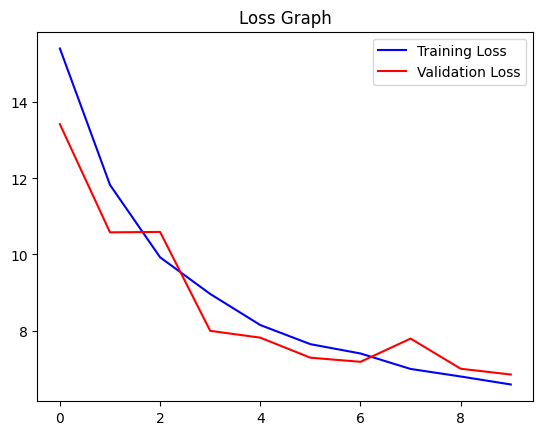

In [20]:
# plot results for age
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(loss))

plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [21]:
def get_image_features(image):
  img = load_img(image, grayscale=True)
  img = img.resize((128, 128), Image.LANCZOS)
  img = np.array(img)
  img = img.reshape(1, 128, 128, 1)
  img = img / 255.0
  return img

1/1 [==============================] - 0s 149ms/step


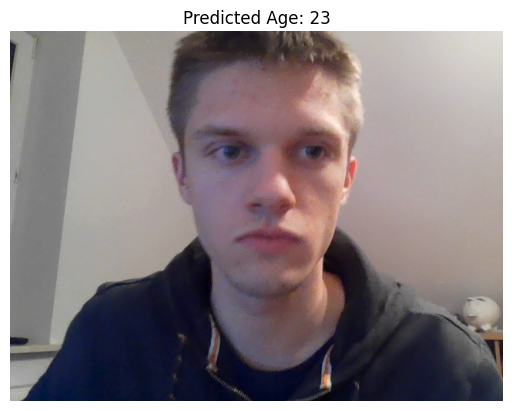

In [22]:
img_to_test = 'CamData/data/test/images/00bf6f4c-7fdd-11ee-9103-ec773ba9cb5a.jpg'
features = get_image_features(img_to_test)
pred = model.predict(features)
age = round(pred[0][0])

plt.title(f'Predicted Age: {age}')
plt.axis('off')
plt.imshow(np.array(load_img(img_to_test)))

In [23]:
from tensorflow.keras.models import load_model
model.save('AgeRecognitionModel.keras')

## ANOTHER MODEL

In [2]:
from move_images_folders import move_images

In [3]:
BASE_DIR = 'C:\\Users\\kacpe\\OneDrive\\Pulpit\\Uczelnia\\semestr5\\MachineLearning\\UTKFace'

In [4]:
move_images(BASE_DIR)

In [5]:
image_filenames = os.listdir(os.path.join(BASE_DIR,'Train'))

In [21]:
def get_ages_images_paths(image_filenames, folder):
    age_labels = []
    image_paths = []
    for image in tqdm(image_filenames):
        image_path = os.path.join(os.path.join(BASE_DIR, folder), image)
        img_components = image.split('_')
    
        if img_components[0] == '.ipynb':
            continue
        age_label = int(img_components[0])
        
        # Append the image_path, age_label, and gender_label
        age_labels.append(age_label)
        image_paths.append(image_path)
    return age_labels, image_paths

In [12]:
age_labels, image_paths = get_ages_images_paths(image_filenames)

  0%|          | 0/15917 [00:00<?, ?it/s]

In [13]:
print(f'Number of age_labels: {len(age_labels)}, Number of image_paths: {len(image_paths)}')
import pandas as pd 
df = pd.DataFrame()
df['image_path'], df['age'] = image_paths, age_labels
df.head(5)

Number of age_labels: 15917, Number of image_paths: 15917


,image_path,age
0,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
1,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
2,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
3,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
4,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100


In [14]:
df['image_path']

0        C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
1        C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
2        C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
3        C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
4        C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
                               ...                        
15912    C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
15913    C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
15914    C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
15915    C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
15916    C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...
Name: image_path, Length: 15917, dtype: object

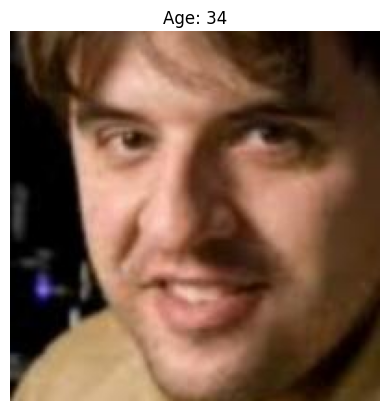

In [15]:
from PIL import Image

rand_index = random.randint(0, len(image_paths))
age = df['age'][rand_index]
IMG = Image.open(df['image_path'][rand_index])
plt.title(f'Age: {age}')
plt.axis('off')
plt.imshow(IMG)

In [17]:
X = extract_image_features(df['image_path'])

  0%|          | 0/15917 [00:00<?, ?it/s]

In [27]:
image_filenames = os.listdir(os.path.join(BASE_DIR,'Val'))

In [28]:
age_labels_val, image_paths_val = get_ages_images_paths(image_filenames, 'Val')

  0%|          | 0/3412 [00:00<?, ?it/s]

In [29]:
print(f'Number of age_labels: {len(age_labels_val)}, Number of image_paths: {len(image_paths_val)}')
import pandas as pd 
df_val = pd.DataFrame()
df_val['image_path'],df_val['age'] = image_paths_val, age_labels_val
df_val.head(5)

Number of age_labels: 3412, Number of image_paths: 3412


,image_path,age
0,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
1,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,100
2,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,101
3,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,10
4,C:\Users\kacpe\OneDrive\Pulpit\Uczelnia\semest...,10


In [30]:
X_val = extract_image_features(df_val['image_path'])

  0%|          | 0/3412 [00:00<?, ?it/s]

In [31]:
X_val.shape
X_val = X_val / 255.0
y_age_val = np.array(df_val['age'])

In [18]:
X.shape
X = X / 255.0
y_age = np.array(df['age'])
input_shape = (128, 128, 1)

In [36]:
from keras.models import Sequential
from keras.layers import Conv2D, AveragePooling2D, GlobalAveragePooling2D, Dense

final_cnn = Sequential()

final_cnn.add(Conv2D(filters=32, kernel_size=3, activation='relu', input_shape=input_shape))    # 3rd dim = 1 for grayscale images.
final_cnn.add(AveragePooling2D(pool_size=(2,2)))

final_cnn.add(Conv2D(filters=64, kernel_size=3, activation='relu'))
final_cnn.add(AveragePooling2D(pool_size=(2,2)))

final_cnn.add(Conv2D(filters=128, kernel_size=3, activation='relu'))
final_cnn.add(AveragePooling2D(pool_size=(2,2)))

final_cnn.add(Conv2D(filters=256, kernel_size=3, activation='relu'))
final_cnn.add(AveragePooling2D(pool_size=(2,2)))

final_cnn.add(GlobalAveragePooling2D())

final_cnn.add(Dense(132, activation='relu'))

final_cnn.add(Dense(1, activation='linear')) # Predicting a continuous variable

final_cnn.compile(loss='mean_squared_error', optimizer='adam')

final_cnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 126, 126, 32)      320       
                                                                 
 average_pooling2d_4 (Avera  (None, 63, 63, 32)        0         
 gePooling2D)                                                    
                                                                 
 conv2d_5 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 average_pooling2d_5 (Avera  (None, 30, 30, 64)        0         
 gePooling2D)                                                    
                                                                 
 conv2d_6 (Conv2D)           (None, 28, 28, 128)       73856     
                                                                 
 average_pooling2d_6 (Avera  (None, 14, 14, 128)      

In [37]:
from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    shear_range=0.2,
    zoom_range=0.2,
    height_shift_range=0.1,
    width_shift_range=0.1,
    rotation_range=15
)

In [38]:
history = final_cnn.fit(datagen.flow(X, y_age, batch_size=32),
                        steps_per_epoch=len(X) / 32, epochs=60, verbose=1, validation_data=(X_val, y_age_val))

Epoch 1/60
497/497 [==============================] - 105s 208ms/step - loss: 437.6230 - val_loss: 622.4389
Epoch 2/60
497/497 [==============================] - 100s 201ms/step - loss: 399.7627 - val_loss: 529.7137
Epoch 3/60
497/497 [==============================] - 106s 213ms/step - loss: 398.3065 - val_loss: 701.8294
Epoch 4/60
497/497 [==============================] - 105s 211ms/step - loss: 393.1909 - val_loss: 608.5653
Epoch 5/60
497/497 [==============================] - 104s 208ms/step - loss: 394.5312 - val_loss: 533.4412
Epoch 6/60
497/497 [==============================] - 106s 213ms/step - loss: 391.8586 - val_loss: 519.4532
Epoch 7/60
497/497 [==============================] - 102s 204ms/step - loss: 390.0661 - val_loss: 738.3380
Epoch 8/60
497/497 [==============================] - 101s 203ms/step - loss: 385.7003 - val_loss: 493.6299
Epoch 9/60
497/497 [==============================] - 101s 203ms/step - loss: 381.3679 - val_loss: 730.9609
Epoch 10/60
497/497 [=======

In [40]:
def get_image_features(image):
  img = load_img(image, grayscale=True)
  img = img.resize((128, 128), Image.LANCZOS)
  img = np.array(img)
  img = img.reshape(1, 128, 128, 1)
  img = img / 255.0
  return img

In [46]:
img_to_test = 'FaceRecognition/CamData/data/test/images/00bf6f4c-7fdd-11ee-9103-ec773ba9cb5a.jpg'
features = get_image_features(img_to_test)
pred = final_cnn.predict(features)

1/1 [==============================] - 0s 23ms/step


In [54]:
print(pred)
age = round(pred[0][0])


[[58.20982]]


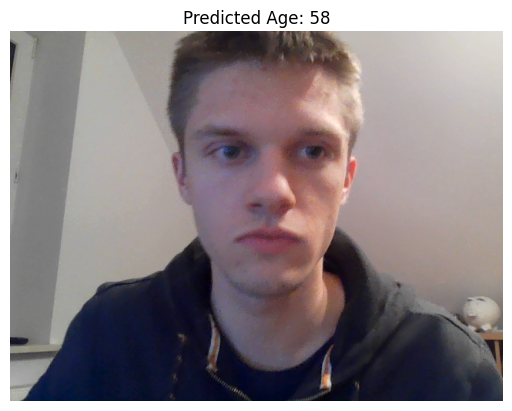

In [51]:
plt.title(f'Predicted Age: {age}')
plt.axis('off')
plt.imshow(np.array(load_img(img_to_test)))

In [52]:
from tensorflow.keras.models import load_model
final_cnn.save('BadlyWorkingModel.keras')

## TESTING AGE RECOGNITION

In [13]:
# Parameters
current_directory = os.getcwd()

# Name of the model to be evaluated
model_name = 'AgeRecognitionModel.keras'

# Name of the directory in which files with test results will be saved
evaluation_directory_name = 'eval-test'

# Path to the directory where txt files with results will be saved
evaluation_directory_path = os.path.join(current_directory, evaluation_directory_name)

# Name of the file with the data for each image
eval_file_name = 'evaluation.txt'

# Name of the file with the result data
result_file_name = 'result.txt'

# Path to the folder containing images to be used for testing purposes
images_path = 'C:\\Users\\Adrian\\source\\Python\\images\\dataset'

# Parameter defining whether model predicted age accurately - absolute value of difference between labelled age and predicted age
accuracy_param = 7

# Parameter defining whether the accuracy should be checked in relation to the percentage difference or difference between labelled age and predicted age
accuracy_in_percentage = False

# Size of the age group, ex. for age_group_size = 10, the age groups will be [0-9, 10-19, ...] 
age_group_size = 10

# Name of the residuals histogram
residual_histogram_name = 'residuals_histogram.png'

# Name of the plots to be saved
rmse_plot_name = 'RMSE.png'
mape_plot_name = 'MAPE.png'
count_plot_name = 'Count.png'
accuracy_plot_name = 'Accuracy.png'

In [3]:
# Load the pre-trained model
model_path = os.path.join(current_directory, model_name)
model = load_model(model_path)

# Residuals
residuals = []

In [4]:
# Defining used functions

def create_directory(path, eval_file_name, result_file_name):
    if not os.path.exists(path):
        os.makedirs(path)
        print(f"Created directory at path: {path}")
    
    eval_file_path = os.path.join(path, eval_file_name)
    if os.path.exists(eval_file_path):
        try:
            with open(eval_file_path, 'w') as new_file:
                pass
        except Exception as e:
            print(f"An error occurred: {e}")
            
    result_file_path = os.path.join(path, result_file_name)
    if os.path.exists(result_file_path):
        try:
            with open(result_file_path, 'w') as new_file:
                pass
        except Exception as e:
            print(f"An error occurred: {e}")

def write_to_text_file(dir_path, file_name, content):
    file_path = os.path.join(dir_path, file_name)

    if os.path.exists(file_path):
        with open(file_path, 'a') as file:
            file.write(content + '\n')
    else:
        with open(file_path, 'w') as file:
            file.write(content + '\n')

def get_image_features(image_path):
    img = image.load_img(image_path, grayscale=True)
    img = img.resize((128, 128), Image.LANCZOS)
    img = image.img_to_array(img)
    img = img.reshape(1, 128, 128, 1)
    img = img / 255.0
    return img

# specific logic for data from: https://www.kaggle.com/datasets/rashikrahmanpritom/age-recognition-dataset
# or other images that contains labelled age in the format: AGE_x_y_z.jpg (age must be in the first index separated by '_' sign)
def eval_image(image_file, dir_path, model, eval_dir, accuracy_param):
    img = get_image_features(os.path.join(dir_path, image_file))

    predictions = model.predict(img)
    age = round(predictions[0][0])

    splitted_text = image_file.split('_')
    labelled_age = int(splitted_text[0])
    difference = abs(labelled_age - age)
    percent_difference = abs(int(difference)) / labelled_age * 100
    is_accurate = round(percent_difference) <= accuracy_param if accuracy_in_percentage else round(difference) <= accuracy_param

    eval_file_name = 'evaluation.txt'
    obj = {
        'Model': age,
        'Label': labelled_age,
        'Difference': difference,
        'PercentageDifference': round(percent_difference),
        'Accurate': is_accurate
    }
    labeled_age = obj['Label']
    predicted_age = obj['Model']
    residuals.append(labeled_age - predicted_age)
    write_to_text_file(eval_dir, eval_file_name, str(obj))

def test_images(directory_path, model, eval_dir, accuracy_param):
    if not os.path.exists(directory_path) or not os.path.isdir(directory_path):
        print(f"The specified path '{directory_path}' is not a valid directory.")
        return
    
    files = os.listdir(directory_path)
    
    image_files = [file for file in files if file.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    if not image_files:
        print(f"No image files found in '{directory_path}'.")
        return
    
    for image_file in image_files:
        try:
            eval_image(image_file, directory_path, model, eval_dir, accuracy_param)
        except Exception as e:
            print(f"Error processing {image_file}. Reason: {e}")

def read_residuals(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()

    results = [ast.literal_eval(line.strip()) for line in lines]
    # Calculate residuals and append to the list
    residuals = []
    for result in results:
        labeled_age = result['Label']
        predicted_age = result['Model']
        residuals.append(labeled_age - predicted_age)
    return residuals

In [5]:
def plot_residual_histogram(residuals, save_path=None):
    plt.hist(residuals, bins=30, edgecolor='black', alpha=0.7)
    plt.title('Residuals Histogram')
    plt.xlabel('Residuals')
    plt.ylabel('Count')

    if save_path:
        plt.savefig(save_path)
    else:
        plt.show()

def analyze_and_visualize_data(eval_dir, file_path, residuals):
    data_file = os.path.join(eval_dir, file_path)
    if not os.path.exists(data_file):
        print(f'There is no such a file at the path: {data_file}')
        print('Run test_images in order to evaluate the dataset')
        return
    
    with open(data_file, 'r') as file:
        lines = file.readlines()

    data_str = ''.join(lines).replace('\n', ',')

    data_list = eval('[' + data_str + ']')

    df = pd.DataFrame(data_list)

    # Calculate RMSE and MAPE for all data in the dataset
    rmse_all = np.sqrt(mean_squared_error(df['Label'], df['Model']))
    mape_all = np.mean(np.abs((df['Model'] - df['Label']) / df['Label'])) * 100

    print("RMSE for all data:", rmse_all)
    print("MAPE for all data:", mape_all)

    age_ranges = list(range(0, 111, age_group_size))
    age_labels = [f"{start}-{start+age_group_size-1}" for start in age_ranges[:-1]]

    df['AgeGroup'] = pd.cut(df['Label'], bins=age_ranges, labels=age_labels, right=False)

    rmse_groups = []
    mape_groups = []

    for age_group in age_labels:
        group = df[df['AgeGroup'] == age_group]

        if group.empty:
            rmse_groups.append(0)
            mape_groups.append(0)
            continue

        rmse_group = np.sqrt(mean_squared_error(group['Label'], group['Model']))
        mape_group = np.mean(np.abs((group['Model'] - group['Label']) / group['Label'])) * 100
        rmse_groups.append(rmse_group)
        mape_groups.append(mape_group)
        print(f"\nRMSE for age group {age_group}:", rmse_group)
        print(f"MAPE for age group {age_group}:", mape_group)

    count_per_age_group = df['AgeGroup'].value_counts().sort_index()

    correct_predictions = df[df['Accurate'] == True].shape[0]
    total_predictions = df.shape[0]
    accuracy = correct_predictions / total_predictions * 100

    print("\nAccuracy:", accuracy, "%")

    results_dict = {
        'RMSE_all': rmse_all,
        'MAPE_all': mape_all,
        'RMSE_groups': rmse_groups,
        'MAPE_groups': mape_groups,
        'Accuracy': accuracy
    }

    result_file_path = os.path.join(eval_dir, result_file_name)
    with open(result_file_path, 'w') as results_file:
        results_file.write(str(results_dict))

    labels = [str(age_group) for age_group in age_labels]

    # Plot and save the residuals histogram
    if not residuals:
        residuals_file_path = os.path.join(eval_dir, eval_file_name)
        if not os.path.exists(residuals_file_path):
            print(f"Error with file at path: {residuals_file_path}")
            print("There is no file containing data for each image. Run test_images")
            return
        
        residuals = read_residuals(residuals_file_path)
    histogram_save_path = os.path.join(eval_dir, residual_histogram_name)
    if not os.path.exists(eval_dir):
        print('Path to save the RMSE & MAPE plot is not proper')
        return
    plot_residual_histogram(residuals, save_path=histogram_save_path)

    # RMSE plot for age groups
    plt.figure(figsize=(8, 6))
    plt.bar(labels, rmse_groups, color='blue')
    plt.title('RMSE for Age Groups')
    plt.xlabel('Age Groups')
    plt.ylabel('RMSE')
    plot_image_path = os.path.join(eval_dir, rmse_plot_name)
    if not os.path.exists(eval_dir):
        print('Path to save the RMSE plot is not proper')
        return
    plt.savefig(plot_image_path)
    plt.show()

    # MAPE plot for age groups
    plt.figure(figsize=(8, 6))
    plt.bar(labels, mape_groups, color='orange')
    plt.title('MAPE for Age Groups')
    plt.xlabel('Age Groups')
    plt.ylabel('MAPE')
    plot_image_path = os.path.join(eval_dir, mape_plot_name)
    if not os.path.exists(eval_dir):
        print('Path to save the MAPE plot is not proper')
        return
    plt.savefig(plot_image_path)
    plt.show()

    # Number of people in each age group plot
    plt.figure(figsize=(8, 6))
    plt.bar(count_per_age_group.index, count_per_age_group.values, color='gray')
    plt.title('Number of Observations in Each Age Group')
    plt.xlabel('Age Groups')
    plt.ylabel('Count')
    plot_image_path = os.path.join(eval_dir, count_plot_name)
    if not os.path.exists(eval_dir):
        print('Path to save the Count plot is not proper')
        return
    plt.savefig(plot_image_path)
    plt.show()

    # Accuracy pie plot
    plt.figure(figsize=(8, 6))
    plt.pie([correct_predictions, total_predictions - correct_predictions], labels=['Correct', 'Incorrect'], autopct='%1.1f%%', colors=['green', 'red'])
    plt.title(f'Accuracy of Predictions for param: {accuracy_param}')

    plt.tight_layout()

    plot_image_path = os.path.join(eval_dir, accuracy_plot_name)
    if not os.path.exists(eval_dir):
        print('Path to save the Accuracy plot is not proper')
        return
    plt.savefig(plot_image_path)

    plt.show()

In [11]:

# Create directory or remove its content to save data
create_directory(evaluation_directory_path, eval_file_name, result_file_name)
# Evaluate test images using provided model 
test_images(images_path, model, evaluation_directory_path, accuracy_param)

c:\Users\Patryk\source\Python\AgeRecognition\my_env\Lib\site-packages\keras\src\utils\image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(


1/1 [==============================] - 0s 29ms/step


RMSE for all data: 4.83045891539648
MAPE for all data: 24.56140350877193

RMSE for age group 10-19: 4.83045891539648
MAPE for age group 10-19: 24.56140350877193

Accuracy: 100.0 %


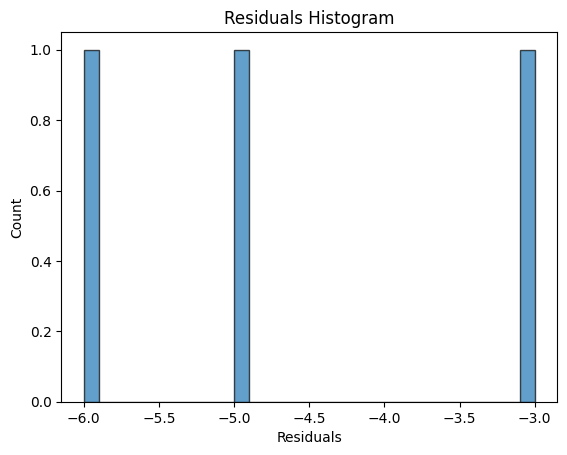

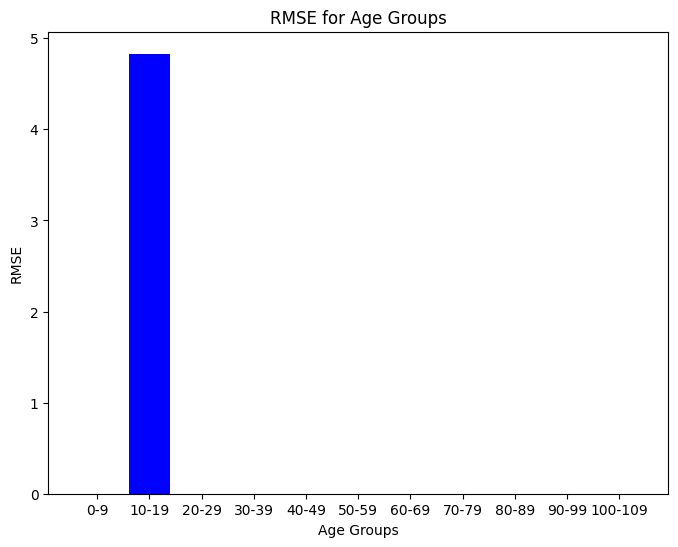

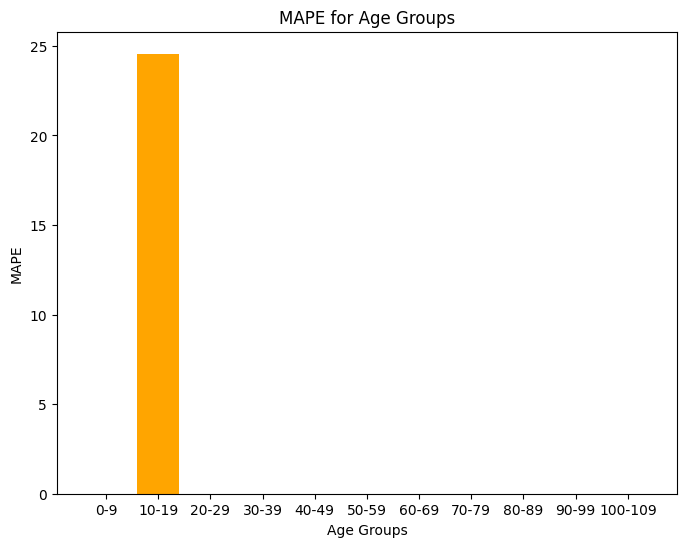

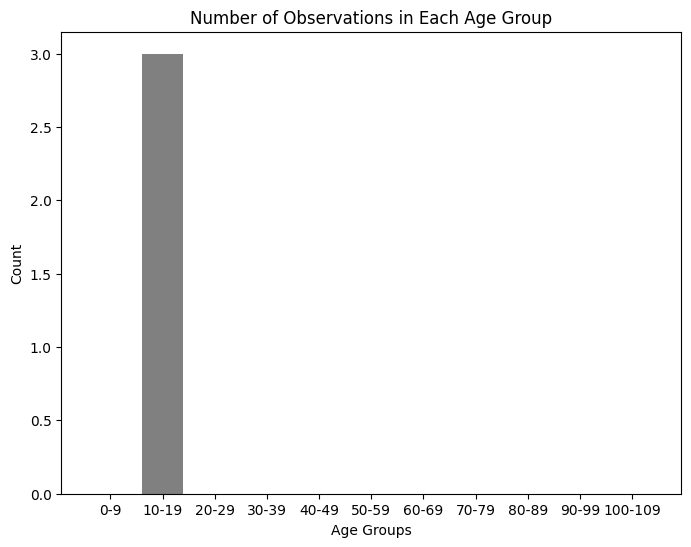

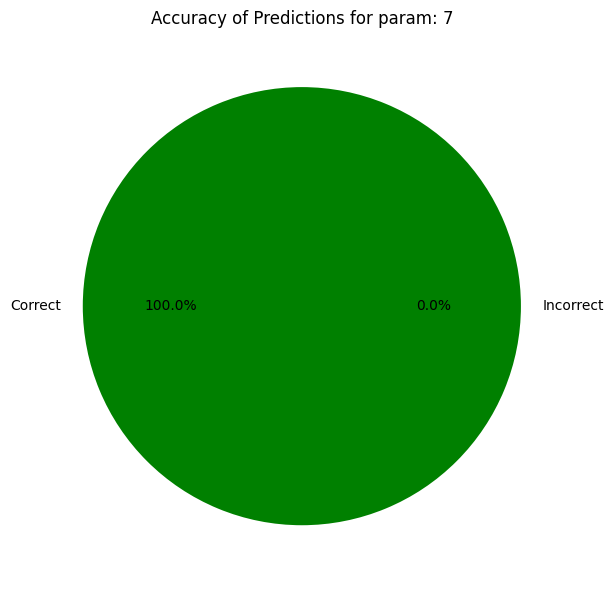

In [12]:
# Analyze and visualize data from the file located at evaluation_directory_path/eval_file_name
analyze_and_visualize_data(evaluation_directory_path, eval_file_name, residuals)